<a href="https://colab.research.google.com/github/ZelihaAleksandrovaToraman/Zeliha/blob/main/HousePricePrediction_Train_Test_V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**House Price Prediction**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#imported packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# **1.Data Collection**

In [3]:
#read the datasets
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
solution = pd.read_csv('solution.csv')

In [4]:
print(train.shape)
print(test.shape)
print(solution.shape)

(1460, 81)
(1459, 80)
(1459, 2)


In [5]:
solution.head()

,Id,SalePrice
0,1461,105000.0
1,1462,172000.0
2,1463,189900.0
3,1464,195500.0
4,1465,191500.0


In [6]:
test = test.merge(solution, on = 'Id')
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000.0
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000.0
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900.0
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,195500.0
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,0,NaN,NaN,NaN,0,1,2010,WD,Normal,191500.0


In [7]:
train = pd.concat([train, test])

In [8]:
train.shape

(2919, 81)

# **2.Exploratory Data Analysis (EDA)**

In [9]:
#When we checked the data description file, it is seen that all NA values are not actually missing value. Some of them represent absence.
#Thats why we replaced the NA to Absence
NA_change = train[['PoolQC','MiscFeature','GarageType','GarageQual','GarageFinish','GarageCond','FireplaceQu','Fence',
                   'BsmtQual','BsmtFinType2','BsmtFinType1','BsmtExposure','BsmtCond','Alley']]

In [10]:
null_train = pd.DataFrame(train.isnull().sum())
null_train = null_train.reset_index()
null_train = null_train.rename(columns={'index': 'Variables', 0:'Count'})
null_train['Proportion'] = null_train['Count']/len(train)
#checked only columns with null values
null_train[null_train['Count']>0].sort_values('Proportion', ascending=False)

,Variables,Count,Proportion
72,PoolQC,2909,0.996574
74,MiscFeature,2814,0.964029
6,Alley,2721,0.932169
73,Fence,2348,0.804385
57,FireplaceQu,1420,0.486468
3,LotFrontage,486,0.166495
60,GarageFinish,159,0.054471
63,GarageQual,159,0.054471
64,GarageCond,159,0.054471
59,GarageYrBlt,159,0.054471


In [11]:
NA_change_col = NA_change.columns
train[NA_change_col] = train[NA_change_col].fillna('Absence')
train[NA_change_col]

,PoolQC,MiscFeature,GarageType,GarageQual,GarageFinish,GarageCond,FireplaceQu,Fence,BsmtQual,BsmtFinType2,BsmtFinType1,BsmtExposure,BsmtCond,Alley
0,Absence,Absence,Attchd,TA,RFn,TA,Absence,Absence,Gd,Unf,GLQ,No,TA,Absence
1,Absence,Absence,Attchd,TA,RFn,TA,TA,Absence,Gd,Unf,ALQ,Gd,TA,Absence
2,Absence,Absence,Attchd,TA,RFn,TA,TA,Absence,Gd,Unf,GLQ,Mn,TA,Absence
3,Absence,Absence,Detchd,TA,Unf,TA,Gd,Absence,TA,Unf,ALQ,No,Gd,Absence
4,Absence,Absence,Attchd,TA,RFn,TA,TA,Absence,Gd,Unf,GLQ,Av,TA,Absence
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,Absence,Absence,Absence,Absence,Absence,Absence,Absence,Absence,TA,Unf,Unf,No,TA,Absence
1455,Absence,Absence,CarPort,TA,Unf,TA,Absence,Absence,TA,Unf,Rec,No,TA,Absence
1456,Absence,Absence,Detchd,TA,Unf,TA,TA,Absence,TA,Unf,ALQ,No,TA,Absence
1457,Absence,Shed,Absence,Absence,Absence,Absence,Absence,MnPrv,Gd,Unf,GLQ,Av,TA,Absence


In [12]:
null_train = pd.DataFrame(train.isnull().sum())
null_train = null_train.reset_index()
null_train = null_train.rename(columns={'index': 'Variables', 0:'Count'})
null_train['Proportion'] = null_train['Count']/len(train)
#checked only columns with null values
null_train[null_train['Count']>0].sort_values('Proportion', ascending=False)

,Variables,Count,Proportion
3,LotFrontage,486,0.166495
59,GarageYrBlt,159,0.054471
25,MasVnrType,24,0.008222
26,MasVnrArea,23,0.007879
2,MSZoning,4,0.001370
47,BsmtFullBath,2,0.000685
9,Utilities,2,0.000685
55,Functional,2,0.000685
48,BsmtHalfBath,2,0.000685
62,GarageArea,1,0.000343


In [13]:
print(train.shape)


(2919, 81)


In [14]:
#checked the type of the columns and non-null variables - It has 43 object, 35 integer and 3 float type of variables.
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2919 entries, 0 to 1458
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          2919 non-null   object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC


## 2.1 Features Inspection

### 2.1.A. Categorical Features

In [15]:
#checked consistency type of categorical columns.
cat = train.select_dtypes(include=['object'])
cat

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
1,RL,Pave,Absence,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
2,RL,Pave,Absence,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
3,RL,Pave,Absence,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,Absence,Absence,Absence,WD,Abnorml
4,RL,Pave,Absence,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,Absence,Absence,Absence,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,RM,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,...,Absence,Absence,Absence,Absence,Y,Absence,Absence,Absence,WD,Normal
1455,RM,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,...,CarPort,Unf,TA,TA,Y,Absence,Absence,Absence,WD,Abnorml
1456,RL,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,...,Detchd,Unf,TA,TA,Y,Absence,Absence,Absence,WD,Abnorml
1457,RL,Pave,Absence,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,...,Absence,Absence,Absence,Absence,Y,Absence,MnPrv,Shed,WD,Normal


In [16]:
#It seems accurate
for col in cat:
    print(train[col].value_counts(normalize=True).sort_values(ascending=False).round(2))

RL         0.78
RM         0.16
FV         0.05
RH         0.01
C (all)    0.01
Name: MSZoning, dtype: float64
Pave    1.0
Grvl    0.0
Name: Street, dtype: float64
Absence    0.93
Grvl       0.04
Pave       0.03
Name: Alley, dtype: float64
Reg    0.64
IR1    0.33
IR2    0.03
IR3    0.01
Name: LotShape, dtype: float64
Lvl    0.90
HLS    0.04
Bnk    0.04
Low    0.02
Name: LandContour, dtype: float64
AllPub    1.0
NoSeWa    0.0
Name: Utilities, dtype: float64
Inside     0.73
Corner     0.18
CulDSac    0.06
FR2        0.03
FR3        0.00
Name: LotConfig, dtype: float64
Gtl    0.95
Mod    0.04
Sev    0.01
Name: LandSlope, dtype: float64
NAmes      0.15
CollgCr    0.09
OldTown    0.08
Edwards    0.07
Somerst    0.06
NridgHt    0.06
Gilbert    0.06
Sawyer     0.05
NWAmes     0.04
SawyerW    0.04
Mitchel    0.04
BrkSide    0.04
Crawfor    0.04
IDOTRR     0.03
Timber     0.02
NoRidge    0.02
StoneBr    0.02
SWISU      0.02
ClearCr    0.02
MeadowV    0.01
BrDale     0.01
Blmngtn    0.01
Veenker

In [17]:
#checked the number of unique values for each column. We should investigate columns with bigger unique numbers such as 25, 15,16
for col in cat:
    print(train[[col]].nunique())

MSZoning    5
dtype: int64
Street    2
dtype: int64
Alley    3
dtype: int64
LotShape    4
dtype: int64
LandContour    4
dtype: int64
Utilities    2
dtype: int64
LotConfig    5
dtype: int64
LandSlope    3
dtype: int64
Neighborhood    25
dtype: int64
Condition1    9
dtype: int64
Condition2    8
dtype: int64
BldgType    5
dtype: int64
HouseStyle    8
dtype: int64
RoofStyle    6
dtype: int64
RoofMatl    8
dtype: int64
Exterior1st    15
dtype: int64
Exterior2nd    16
dtype: int64
MasVnrType    4
dtype: int64
ExterQual    4
dtype: int64
ExterCond    5
dtype: int64
Foundation    6
dtype: int64
BsmtQual    5
dtype: int64
BsmtCond    5
dtype: int64
BsmtExposure    5
dtype: int64
BsmtFinType1    7
dtype: int64
BsmtFinType2    7
dtype: int64
Heating    6
dtype: int64
HeatingQC    5
dtype: int64
CentralAir    2
dtype: int64
Electrical    5
dtype: int64
KitchenQual    4
dtype: int64
Functional    7
dtype: int64
FireplaceQu    6
dtype: int64
GarageType    7
dtype: int64
GarageFinish    4
dtype: int6

In [18]:
print(train.shape)


(2919, 81)


In [19]:
#checked the number of categorical variables
#for variable in cat:
 #   plt.figure(figsize=(8,6))
  #  ax = sns.countplot(x=variable, data=train, order=train[variable].value_counts().sort_values(ascending=False).index)
   # plt.xticks(size = 10,rotation = 45 )
    #ax.set_ylabel("Count")
    #for p in ax.patches:
   #     percentage = '{:.1f}%'.format(100 * p.get_height()/len(train))
    #    x = p.get_x() + p.get_width()
     #   y = p.get_height()
      #  ax.annotate(percentage, (x, y),ha='right')
#plt.show()

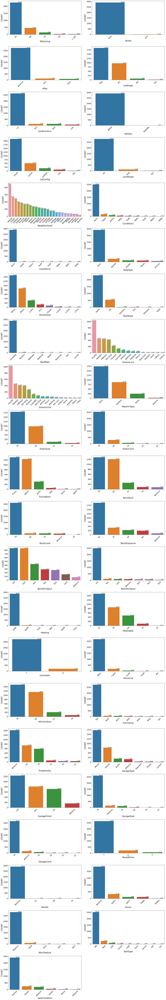

In [20]:
#Second alternative for visualization
fig = plt.figure(figsize=(20,140))
for index,col in enumerate(cat.columns):
    plt.subplot(26,2,index+1)
    ax = sns.countplot(x=cat.iloc[:,index], data=cat.dropna(), order=train[col].value_counts().sort_values(ascending=False).index)
    plt.ylabel('COUNT', size = 18,color="black")
    plt.xlabel(col, fontsize = 18,color="black")
    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/len(train))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x, y),ha='right')
    
fig.tight_layout(pad=1.0)

In [21]:
cat.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [22]:
#Adding some columns related to features that there are in the house (train)
train['Pool_'] = train.apply(lambda x: 'No' if x['PoolQC']=='Absence' else 'Yes', axis=1)
train['Basement_'] = train.apply(lambda x: 'No' if x['BsmtQual']=='Absence' else 'Yes', axis=1)
train['Fence_'] = train.apply(lambda x: 'No' if x['Fence']=='Absence' else 'Yes', axis=1)
train['Fireplace_'] = train.apply(lambda x: 'No' if x['FireplaceQu']=='Absence' else 'Yes', axis=1)
train['Garage_'] = train.apply(lambda x: 'No' if x['GarageType']=='Absence' else 'Yes', axis=1)
train['Alley_'] = train.apply(lambda x: 'No' if x['Alley']=='Absence' else 'Yes', axis=1)

In [23]:
train[['Pool_','Basement_','Fence_','Fireplace_','Garage_','Alley_']].head()

,Pool_,Basement_,Fence_,Fireplace_,Garage_,Alley_
0,No,Yes,No,No,Yes,No
1,No,Yes,No,Yes,Yes,No
2,No,Yes,No,Yes,Yes,No
3,No,Yes,No,Yes,Yes,No
4,No,Yes,No,Yes,Yes,No


In [24]:
print(train.shape)


(2919, 87)


#### 2.1.A.1 Elimination of the columns with more than 95% values

In [25]:
# Create empty lists to store the useful and useless variables
usefull = []
useless = []

cat = train.select_dtypes(include=['object'])

# Create a dictionary to store the category counts
category_counts = {}

# Loop through each categorical variable
for variable in cat:
    
    # Count the number of occurrences of each category in the variable
    category_counts[variable] = {}
    for category in train[variable].unique():
        # Skip NaN categories
        if pd.isna(category):
            continue
        category_counts[variable][category] = train[variable].value_counts(normalize=True)[category]
        
    # Calculate the total count of categories across all variables
    total_count = sum(category_counts[variable].values())
    
    # Check if any category has a count of 95% or more
    for category in category_counts[variable]:
        if category_counts[variable][category] >= 0.95:
            useless.append(variable)
            break
    
    # If no category has a count of 95% or more, add the variable to the useful list
    if variable not in useless:
        usefull.append(variable)
        
    # Calculate the percentage of each category relative to the total count
    for category in category_counts[variable]:
        category_counts[variable][category] = category_counts[variable][category] / total_count * 100
        
# Print the category counts for each variable
for variable in cat:
    print(f"Variable: {variable}")
    for category, count in category_counts[variable].items():
        print(f"{category}: {count:.2f}%")
    print("\n")
    
# Print the useful and useless lists
print(f"Usefull variables: {usefull}")
print(f"Useless variables: {useless}")

Variable: MSZoning
RL: 77.70%
RM: 15.78%
C (all): 0.86%
FV: 4.77%
RH: 0.89%


Variable: Street
Pave: 99.59%
Grvl: 0.41%


Variable: Alley
Absence: 93.22%
Grvl: 4.11%
Pave: 2.67%


Variable: LotShape
Reg: 63.69%
IR1: 33.16%
IR2: 2.60%
IR3: 0.55%


Variable: LandContour
Lvl: 89.83%
Bnk: 4.01%
Low: 2.06%
HLS: 4.11%


Variable: Utilities
AllPub: 99.97%
NoSeWa: 0.03%


Variable: LotConfig
Inside: 73.07%
FR2: 2.91%
Corner: 17.51%
CulDSac: 6.03%
FR3: 0.48%


Variable: LandSlope
Gtl: 95.17%
Mod: 4.28%
Sev: 0.55%


Variable: Neighborhood
CollgCr: 9.15%
Veenker: 0.82%
Crawfor: 3.53%
NoRidge: 2.43%
Mitchel: 3.91%
Somerst: 6.24%
NWAmes: 4.49%
OldTown: 8.19%
BrkSide: 3.70%
Sawyer: 5.17%
NridgHt: 5.69%
NAmes: 15.18%
SawyerW: 4.28%
IDOTRR: 3.19%
MeadowV: 1.27%
Edwards: 6.65%
Timber: 2.47%
Gilbert: 5.65%
StoneBr: 1.75%
ClearCr: 1.51%
NPkVill: 0.79%
Blmngtn: 0.96%
BrDale: 1.03%
SWISU: 1.64%
Blueste: 0.34%


Variable: Condition1
Norm: 86.02%
Feedr: 5.62%
PosN: 1.34%
Artery: 3.15%
RRAe: 0.96%
RRNn: 0.31%

In [26]:
useless

['Street',
 'Utilities',
 'LandSlope',
 'Condition2',
 'RoofMatl',
 'Heating',
 'PoolQC',
 'MiscFeature',
 'Pool_',
 'Basement_']

<Axes: xlabel='PoolQC', ylabel='SalePrice'>

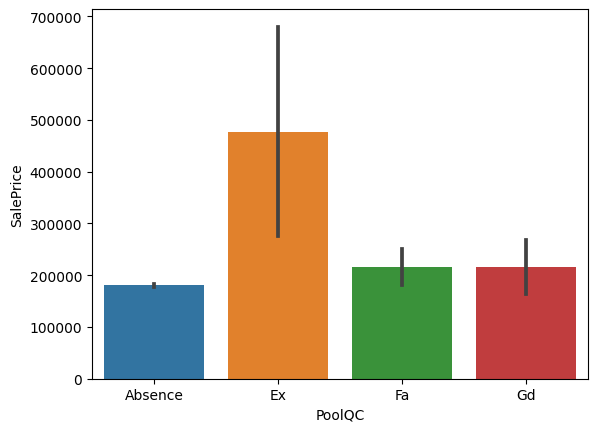

In [27]:
sns.barplot(x=train['PoolQC'], y=train['SalePrice'])

In [28]:
#We have decided to remove these columns from dataset due to we believe that they do not give us accurate information. 
train = train.drop(useless, axis=1)

print(train.shape)


(2919, 77)


In [29]:
cat_2 = train.select_dtypes(include='object')
for col in cat_2:
  print(train[col].value_counts(normalize=True).round(2))

RL         0.78
RM         0.16
FV         0.05
RH         0.01
C (all)    0.01
Name: MSZoning, dtype: float64
Absence    0.93
Grvl       0.04
Pave       0.03
Name: Alley, dtype: float64
Reg    0.64
IR1    0.33
IR2    0.03
IR3    0.01
Name: LotShape, dtype: float64
Lvl    0.90
HLS    0.04
Bnk    0.04
Low    0.02
Name: LandContour, dtype: float64
Inside     0.73
Corner     0.18
CulDSac    0.06
FR2        0.03
FR3        0.00
Name: LotConfig, dtype: float64
NAmes      0.15
CollgCr    0.09
OldTown    0.08
Edwards    0.07
Somerst    0.06
NridgHt    0.06
Gilbert    0.06
Sawyer     0.05
NWAmes     0.04
SawyerW    0.04
Mitchel    0.04
BrkSide    0.04
Crawfor    0.04
IDOTRR     0.03
Timber     0.02
NoRidge    0.02
StoneBr    0.02
SWISU      0.02
ClearCr    0.02
MeadowV    0.01
BrDale     0.01
Blmngtn    0.01
Veenker    0.01
NPkVill    0.01
Blueste    0.00
Name: Neighborhood, dtype: float64
Norm      0.86
Feedr     0.06
Artery    0.03
RRAn      0.02
PosN      0.01
RRAe      0.01
PosA      0.01


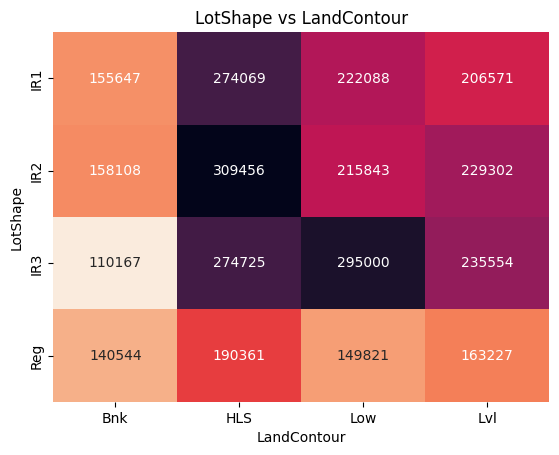

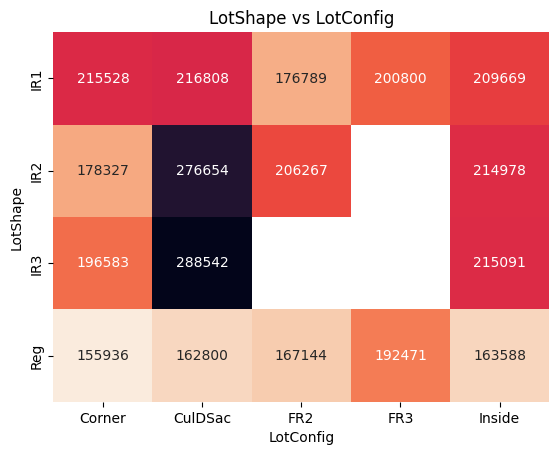

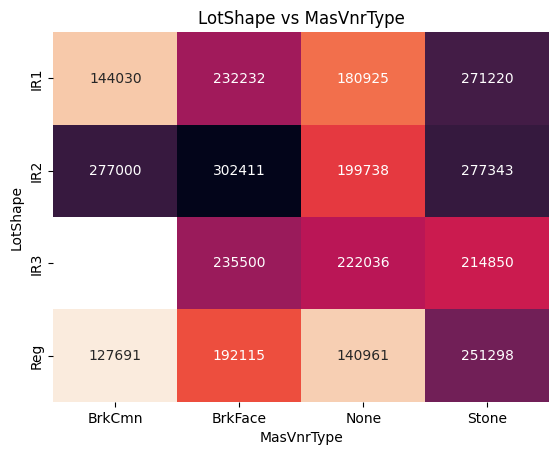

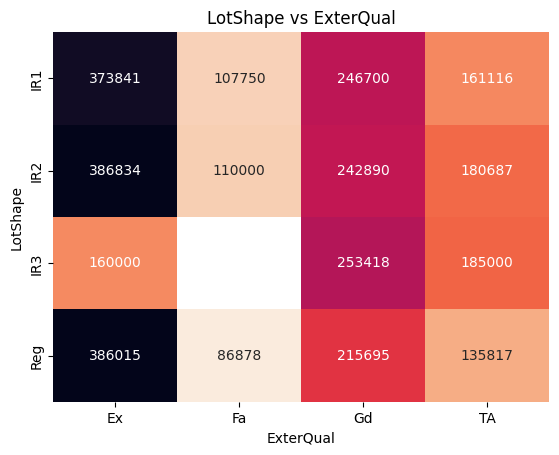

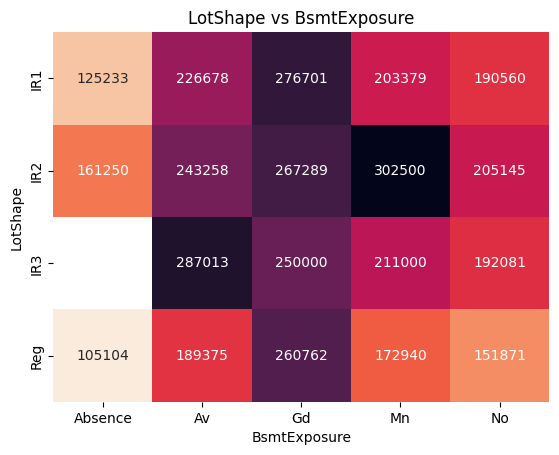

...

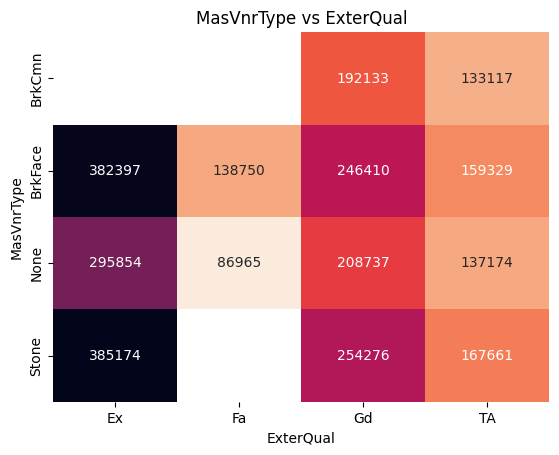

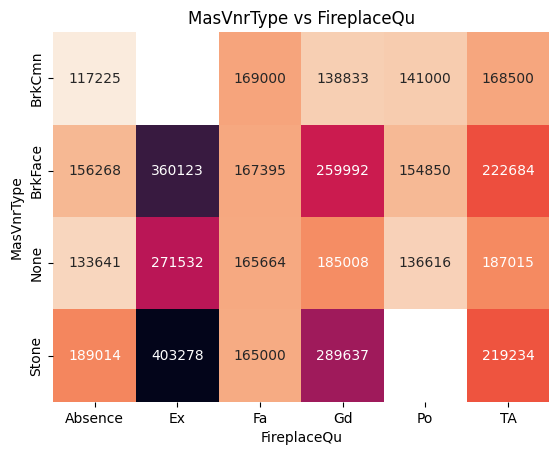

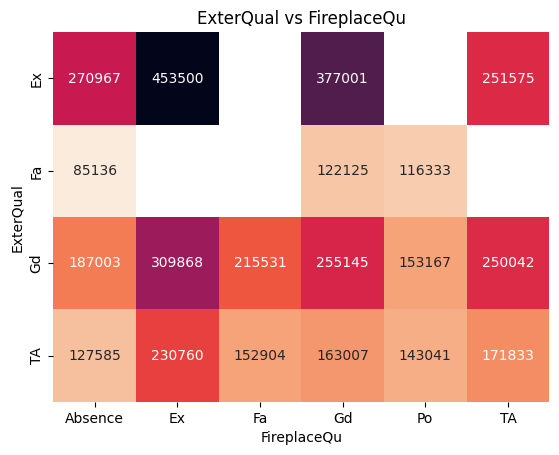

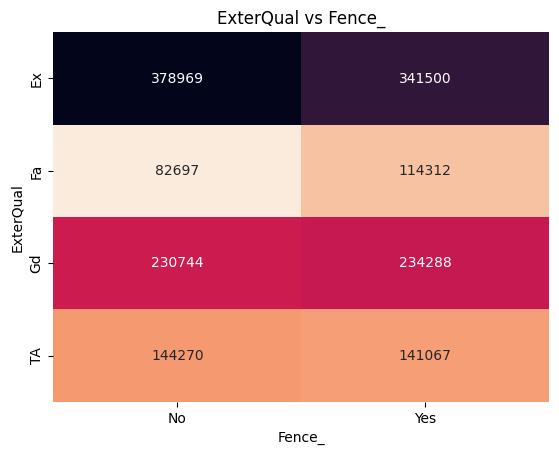

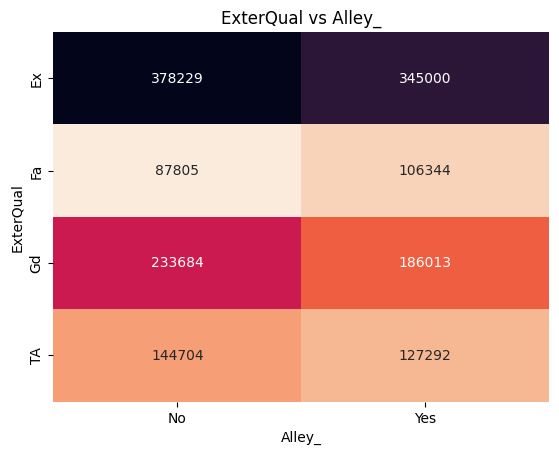

In [30]:
# create a list of categorical columns
cat_cols = [col for col in train.columns if train[col].dtype == 'object']

# create a crosstab and plot heatmap for each pair of columns with mean SalePrice greater than 260,000
for i, col in enumerate(cat_cols):
    for j in range(i+1, len(cat_cols)):
        other_col = cat_cols[j]
        ct = pd.crosstab(train[col], train[other_col], values=train['SalePrice'], aggfunc=np.mean).round(0)
        if ct.mean().mean() > 200000:
            fig, ax = plt.subplots()
            sns.heatmap(ct, annot=True, fmt='g', cmap='rocket_r', cbar=False, ax=ax)
            ax.set_title(f"{col} vs {other_col}")
            plt.show()

In [31]:
#train[(train['Alley_']=='No')&(train['ExterQual']=='Ex')]
#train[(train['Fence_']=='No')&(train['ExterQual']=='Ex')]
#train[(train['ExterQual']=='Ex')&(train['MasVnrType']=='Stone')]
#train[(train['ExterQual']=='Ex')&(train['MasVnrType']=='BrkFace')]
#train[(train['ExterQual']=='Ex')&(train['RoofStyle']=='Hip')]
train[(train['ExterQual']=='Ex')&(train['Condition1']=='PosA')]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,...,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Fence_,Fireplace_,Garage_,Alley_
203,1664,20,RL,105.0,13693,Absence,Reg,Lvl,Inside,NridgHt,...,0,3,2009,WD,Normal,610000.0,No,Yes,Yes,No
807,2268,20,RL,81.0,13870,Absence,IR1,HLS,Inside,StoneBr,...,0,10,2007,New,Partial,455000.0,No,Yes,Yes,No
1138,2599,20,RL,85.0,12633,Absence,IR1,HLS,Inside,Timber,...,0,9,2007,New,Partial,392000.0,No,Yes,Yes,No


In [32]:
col = train[['Fence_','Fireplace_','Garage_','Alley_']]
for col in col:
  print(train[col].value_counts(normalize=True).round(2))

No     0.8
Yes    0.2
Name: Fence_, dtype: float64
Yes    0.51
No     0.49
Name: Fireplace_, dtype: float64
Yes    0.95
No     0.05
Name: Garage_, dtype: float64
No     0.93
Yes    0.07
Name: Alley_, dtype: float64


#### 2.1.A.2 Rare Encoding

In [33]:
# Get list of categorical columns
categorical_columns = train.select_dtypes(include='object').columns

# Set the threshold for rare categories
threshold = 0.05

# Loop over all categorical columns and apply rare encoding
for column in categorical_columns:
    counts = train[column].value_counts(normalize=True)
    rare_categories = counts[counts < threshold].index.tolist()
    
    def replace_with_rare(category):
        if category in rare_categories:
            return 'rare_category'
        else:
            return category
    
    train[column] = train[column].apply(replace_with_rare)

In [34]:
for col in train[categorical_columns]:
  print(train[col].value_counts(normalize=True).round(2))

RL               0.78
RM               0.16
rare_category    0.07
Name: MSZoning, dtype: float64
Absence          0.93
rare_category    0.07
Name: Alley, dtype: float64
Reg              0.64
IR1              0.33
rare_category    0.03
Name: LotShape, dtype: float64
Lvl              0.9
rare_category    0.1
Name: LandContour, dtype: float64
Inside           0.73
Corner           0.18
CulDSac          0.06
rare_category    0.03
Name: LotConfig, dtype: float64
rare_category    0.38
NAmes            0.15
CollgCr          0.09
OldTown          0.08
Edwards          0.07
Somerst          0.06
NridgHt          0.06
Gilbert          0.06
Sawyer           0.05
Name: Neighborhood, dtype: float64
Norm             0.86
rare_category    0.08
Feedr            0.06
Name: Condition1, dtype: float64
1Fam             0.83
rare_category    0.09
TwnhsE           0.08
Name: BldgType, dtype: float64
1Story           0.50
2Story           0.30
1.5Fin           0.11
rare_category    0.09
Name: HouseStyle, dty

In [35]:
print(train.shape)


(2919, 77)


### 2.1.B. Numerical Features

In [36]:
#checked the numerical columns
num = train.select_dtypes(exclude=['object'])
num


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706.0,...,0,61,0,0,0,0,0,2,2008,208500.0
1,2,20,80.0,9600,6,8,1976,1976,0.0,978.0,...,298,0,0,0,0,0,0,5,2007,181500.0
2,3,60,68.0,11250,7,5,2001,2002,162.0,486.0,...,0,42,0,0,0,0,0,9,2008,223500.0
3,4,70,60.0,9550,7,5,1915,1970,0.0,216.0,...,0,35,272,0,0,0,0,2,2006,140000.0
4,5,60,84.0,14260,8,5,2000,2000,350.0,655.0,...,192,84,0,0,0,0,0,12,2008,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,21.0,1936,4,7,1970,1970,0.0,0.0,...,0,0,0,0,0,0,0,6,2006,90500.0
1455,2916,160,21.0,1894,4,5,1970,1970,0.0,252.0,...,0,24,0,0,0,0,0,4,2006,71000.0
1456,2917,20,160.0,20000,5,7,1960,1996,0.0,1224.0,...,474,0,0,0,0,0,0,9,2006,131000.0
1457,2918,85,62.0,10441,5,5,1992,1992,0.0,337.0,...,80,32,0,0,0,0,700,7,2006,132000.0


In [37]:
num[['1stFlrSF','2ndFlrSF']]

,1stFlrSF,2ndFlrSF
0,856,854
1,1262,0
2,920,866
3,961,756
4,1145,1053
...,...,...
1454,546,546
1455,546,546
1456,1224,0
1457,970,0


In [38]:
#checked the summary statistics of the numerical variables - eliminated the ID column because its not a variable that we will use in model.
#We have to check the columns that have 2 or 3 different values because they can be categorical not numerical variables.
#MSSubClass integer but it identifies the type of dwelling involved in the sale. 
#OverallQual integer but it rates overall material of the house (ordinal) - kategorikmiş gibi davranıcaz başta. Hist veya barplot 
#OverallCond integer but it rates overall condition of the house (ordinal)
#YearBuilt integer but it is a date. - günümüzden çıkarıp yaş olarak da dikkate alabiliriz yıl olarak da kalabilir.
#YearRemodAdd integer but it is a date.
#MoSold integer but it is month sold
#YrSold integer but its year sold
#GarageYrBuilt is float but its year garage was built, so type of the column should be changed.
num.iloc[:,1:].describe([0.25,0.50,0.75,0.99]).T

,count,mean,std,min,25%,50%,75%,99%,max
MSSubClass,2919.0,57.137718,42.517628,20.0,20.0,50.0,70.0,190.00,190.0
LotFrontage,2433.0,69.305795,23.344905,21.0,59.0,68.0,80.0,135.68,313.0
LotArea,2919.0,10168.114080,7886.996359,1300.0,7478.0,9453.0,11570.0,33038.64,215245.0
OverallQual,2919.0,6.089072,1.409947,1.0,5.0,6.0,7.0,10.00,10.0
OverallCond,2919.0,5.564577,1.113131,1.0,5.0,5.0,6.0,9.00,9.0
YearBuilt,2919.0,1971.312778,30.291442,1872.0,1953.5,1973.0,2001.0,2008.00,2010.0
YearRemodAdd,2919.0,1984.264474,20.894344,1950.0,1965.0,1993.0,2004.0,2009.00,2010.0
MasVnrArea,2896.0,102.201312,179.334253,0.0,0.0,0.0,164.0,771.05,1600.0
BsmtFinSF1,2918.0,441.423235,455.610826,0.0,0.0,368.5,733.0,1635.32,5644.0
BsmtFinSF2,2918.0,49.582248,169.205611,0.0,0.0,0.0,0.0,874.66,1526.0


In [39]:
#droped the Id column in num dataset to explore the data correctly.
num_2 = num.drop(['Id','GarageYrBlt', 'MoSold','MSSubClass', 'YearBuilt','YearRemodAdd','YrSold','OverallCond','OverallQual','GarageCars','BsmtFullBath', 'BsmtHalfBath', 'FullBath', 
                  'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces'], axis=1)
num_2

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
0,65.0,8450,196.0,706.0,0.0,150.0,856.0,856,854,0,1710,548.0,0,61,0,0,0,0,0,208500.0
1,80.0,9600,0.0,978.0,0.0,284.0,1262.0,1262,0,0,1262,460.0,298,0,0,0,0,0,0,181500.0
2,68.0,11250,162.0,486.0,0.0,434.0,920.0,920,866,0,1786,608.0,0,42,0,0,0,0,0,223500.0
3,60.0,9550,0.0,216.0,0.0,540.0,756.0,961,756,0,1717,642.0,0,35,272,0,0,0,0,140000.0
4,84.0,14260,350.0,655.0,0.0,490.0,1145.0,1145,1053,0,2198,836.0,192,84,0,0,0,0,0,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,21.0,1936,0.0,0.0,0.0,546.0,546.0,546,546,0,1092,0.0,0,0,0,0,0,0,0,90500.0
1455,21.0,1894,0.0,252.0,0.0,294.0,546.0,546,546,0,1092,286.0,0,24,0,0,0,0,0,71000.0
1456,160.0,20000,0.0,1224.0,0.0,0.0,1224.0,1224,0,0,1224,576.0,474,0,0,0,0,0,0,131000.0
1457,62.0,10441,0.0,337.0,0.0,575.0,912.0,970,0,0,970,0.0,80,32,0,0,0,0,700,132000.0


In [40]:
num_2.describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,2433.0,69.305795,23.344905,21.0,59.0,68.0,80.0,313.0
LotArea,2919.0,10168.114080,7886.996359,1300.0,7478.0,9453.0,11570.0,215245.0
MasVnrArea,2896.0,102.201312,179.334253,0.0,0.0,0.0,164.0,1600.0
BsmtFinSF1,2918.0,441.423235,455.610826,0.0,0.0,368.5,733.0,5644.0
BsmtFinSF2,2918.0,49.582248,169.205611,0.0,0.0,0.0,0.0,1526.0
BsmtUnfSF,2918.0,560.772104,439.543659,0.0,220.0,467.0,805.5,2336.0
TotalBsmtSF,2918.0,1051.777587,440.766258,0.0,793.0,989.5,1302.0,6110.0
1stFlrSF,2919.0,1159.581706,392.362079,334.0,876.0,1082.0,1387.5,5095.0
2ndFlrSF,2919.0,336.483727,428.701456,0.0,0.0,0.0,704.0,2065.0
LowQualFinSF,2919.0,4.694416,46.396825,0.0,0.0,0.0,0.0,1064.0


<ipython-input-41-825ec61dfc45>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=num_2.iloc[:,index])
<ipython-input-41-825ec61dfc45>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=num_2.iloc[:,index])
<ipython-input-41-825ec61dfc45>:5: UserWarning: 

`distplot` is a deprecated function an

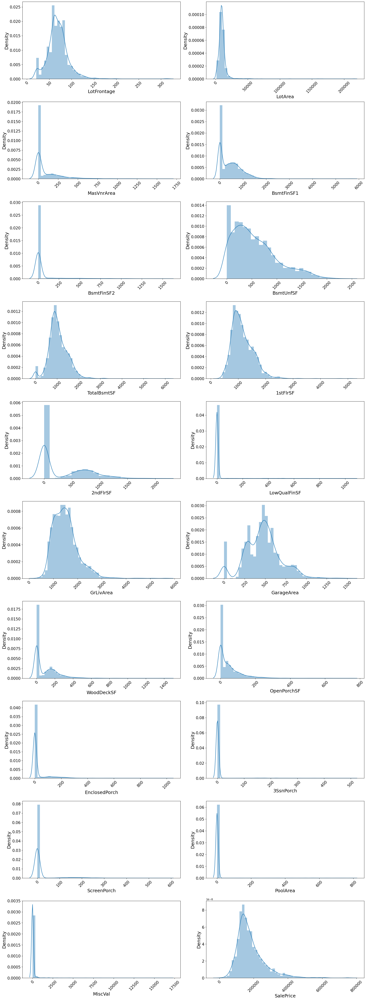

In [41]:
#Second alternative for visualization
fig = plt.figure(figsize=(20,140))
for index,col in enumerate(num_2.columns):
    plt.subplot(26,2,index+1)
    sns.distplot(x=num_2.iloc[:,index])
    plt.ylabel('Density', size = 18,color="black")
    plt.xlabel(col, fontsize = 18,color="black")

    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )
    
fig.tight_layout(pad=1.0)

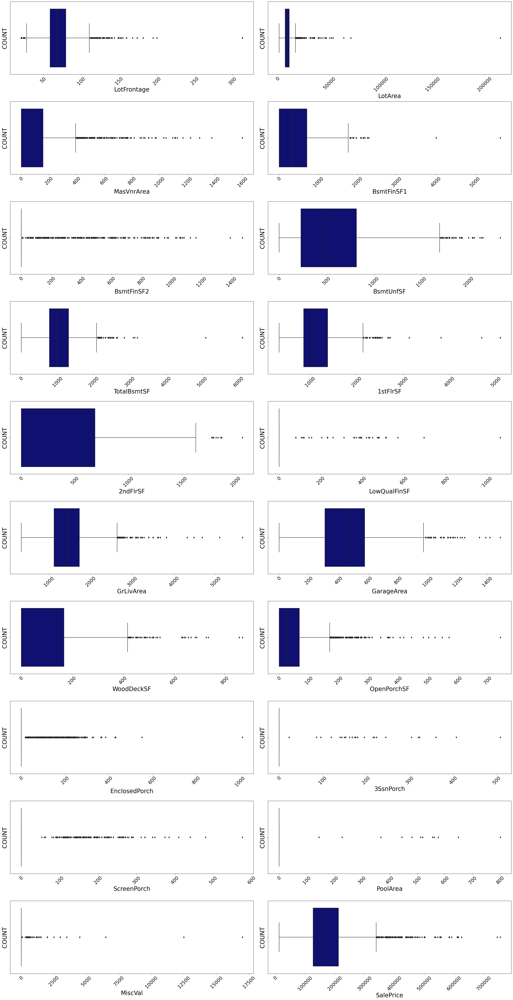

In [42]:
fig = plt.figure(figsize=(30,150))
for index,col in enumerate(num_2):
    plt.subplot(26,2,index+1)
    sns.boxplot(x=col, data=num_2.dropna(), color='navy')
    plt.ylabel('COUNT', size = 25,color="black" )
    plt.xlabel(col, fontsize = 25,color="black" )
    plt.xticks(size = 20,color="black", rotation = 45 )
    plt.yticks(size = 20,color="black" )
    
fig.tight_layout(pad=1.0)

#### 2.1.B.a Elimination of the columns with more then 90% zero

In [43]:
#Check the features have zero value
num_zeros_per_col = (train == 0).sum(axis=0).sort_values(ascending=False).reset_index().rename(columns={'index': 'Feature', 0: 'Count'})
num_zeros_per_col['Proportion'] = num_zeros_per_col['Count'] / len(train)
zero_columns_90_percent = num_zeros_per_col[num_zeros_per_col['Proportion']>=0.90]
zero_columns_90_percent

,Feature,Count,Proportion
0,PoolArea,2906,0.995546
1,3SsnPorch,2882,0.987324
2,LowQualFinSF,2879,0.986297
3,MiscVal,2816,0.964714
4,BsmtHalfBath,2742,0.939363
5,ScreenPorch,2663,0.912299


In [44]:
#examine more columns with zero values
zero_columns = zero_columns_90_percent['Feature'].values
train[zero_columns].nunique()

PoolArea         14
3SsnPorch        31
LowQualFinSF     36
MiscVal          38
BsmtHalfBath      3
ScreenPorch     121
dtype: int64

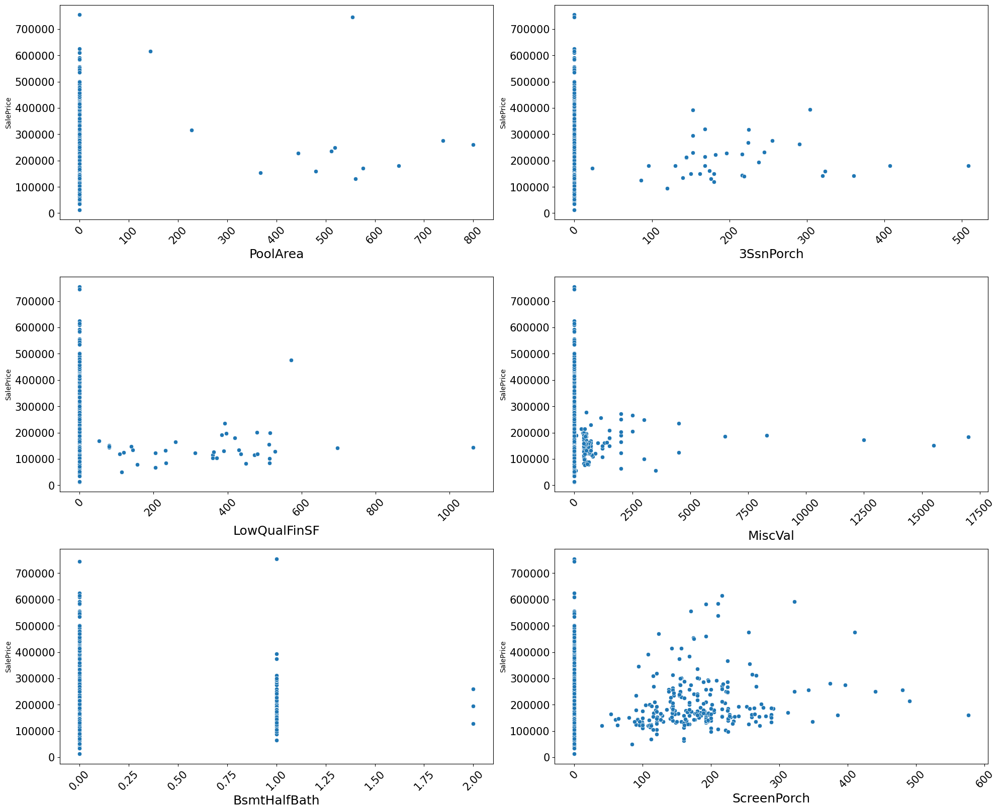

In [45]:

fig = plt.figure(figsize=(20,140))
for index,col in enumerate(train[zero_columns].columns):
    plt.subplot(26,2,index+1)
    sns.scatterplot(x=train[zero_columns].iloc[:,index], y=train['SalePrice'])
    plt.xlabel(col, fontsize = 18,color="black")

    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )
    
fig.tight_layout(pad=1.0)

In [46]:
train[zero_columns].describe([0.25,0.50,0.75,0.99]).T

,count,mean,std,min,25%,50%,75%,99%,max
PoolArea,2919.0,2.251799,35.663946,0.0,0.0,0.0,0.0,0.00,800.0
3SsnPorch,2919.0,2.602261,25.188169,0.0,0.0,0.0,0.0,144.00,508.0
LowQualFinSF,2919.0,4.694416,46.396825,0.0,0.0,0.0,0.0,153.84,1064.0
MiscVal,2919.0,50.825968,567.402211,0.0,0.0,0.0,0.0,982.00,17000.0
BsmtHalfBath,2917.0,0.061364,0.245687,0.0,0.0,0.0,0.0,1.00,2.0
ScreenPorch,2919.0,16.062350,56.184365,0.0,0.0,0.0,0.0,259.82,576.0


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'PoolArea'),
  Text(1, 0, '3SsnPorch'),
  Text(2, 0, 'LowQualFinSF'),
  Text(3, 0, 'MiscVal'),
  Text(4, 0, 'BsmtHalfBath'),
  Text(5, 0, 'ScreenPorch')])

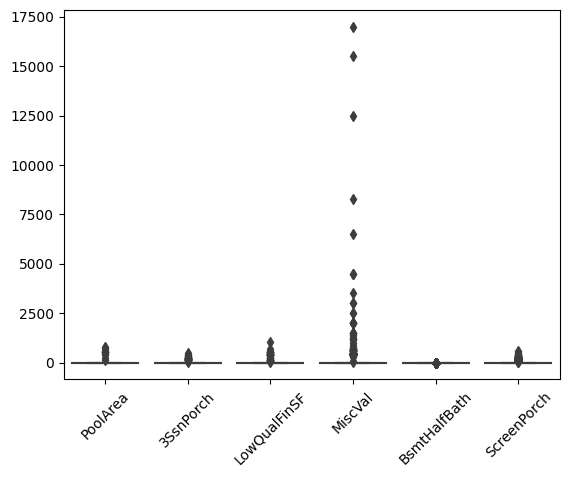

In [47]:
sns.boxplot(train[zero_columns])
plt.xticks(rotation = 45)

In [48]:
zero_columns

array(['PoolArea', '3SsnPorch', 'LowQualFinSF', 'MiscVal', 'BsmtHalfBath',
       'ScreenPorch'], dtype=object)

In [49]:
corr_with_saleprice = train.corr().loc[:, ['SalePrice', 'PoolArea', '3SsnPorch', 'LowQualFinSF', 'MiscVal']]
# sort the resulting DataFrame by the 'SalePrice' column in descending order
corr_with_saleprice = corr_with_saleprice.sort_values(by='SalePrice', ascending=False)
corr_with_saleprice.T

<ipython-input-49-369545691eee>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_with_saleprice = train.corr().loc[:, ['SalePrice', 'PoolArea', '3SsnPorch', 'LowQualFinSF', 'MiscVal']]


,SalePrice,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,YearBuilt,FullBath,YearRemodAdd,...,BsmtFinSF2,MiscVal,Id,YrSold,BsmtHalfBath,LowQualFinSF,MSSubClass,OverallCond,KitchenAbvGr,EnclosedPorch
SalePrice,1.000000,0.800888,0.708096,0.649512,0.641746,0.633231,0.621541,0.558433,0.548138,0.533158,...,0.005803,-0.015605,-0.017118,-0.030064,-0.035592,-0.037598,-0.087039,-0.101488,-0.119693,-0.128527
PoolArea,0.068531,0.030740,0.135441,0.030424,0.053049,0.072216,0.121900,0.002304,0.028091,-0.011407,...,0.044524,0.011921,0.014332,-0.052816,0.066851,0.035177,-0.003080,-0.016876,-0.013116,0.092534
3SsnPorch,0.032367,0.018715,0.006268,0.023383,0.029440,0.037892,0.044086,0.015958,0.015192,0.037433,...,-0.023279,-0.000788,-0.046538,0.022560,0.026861,-0.004545,-0.037529,0.043739,-0.021462,-0.032822
LowQualFinSF,-0.037598,-0.048393,0.096916,-0.067336,-0.053551,-0.023359,-0.012704,-0.144191,-0.002876,-0.060371,...,-0.004923,-0.005973,-0.037816,-0.002257,-0.013500,1.000000,0.026482,0.009048,0.000438,0.087212
MiscVal,-0.015605,0.005562,0.067118,-0.016934,0.008446,0.084002,0.093062,-0.010886,-0.010024,-0.003124,...,-0.005139,1.000000,0.008244,0.008445,0.036902,-0.005973,-0.028867,0.033956,0.025078,0.008654


In [50]:
zero_columns

array(['PoolArea', '3SsnPorch', 'LowQualFinSF', 'MiscVal', 'BsmtHalfBath',
       'ScreenPorch'], dtype=object)

In [51]:
#dropped the zero columns from orijinal dataset.
train = train.drop(zero_columns, axis=1)

print(train.shape)


(2919, 71)


In [52]:
train['BsmtType1_ratio'] = train['BsmtFinSF1'] / train['TotalBsmtSF'] #BsmtFinSF1/TotalBsmtSF
train['BsmtType2_ratio'] = train['BsmtFinSF2'] / train['TotalBsmtSF'] #BsmtFinSF2/TotalBsmtSF
train['BsmtUnfinished_ratio'] = train['BsmtUnfSF'] / train['TotalBsmtSF']  # BsmtUnfSF/TotalBsmtSF
train['enclosedporch_ratio'] = train['EnclosedPorch'] / train['LotArea'] #EnclosedPorch/LotArea
train['Garage_ratio'] = train['GarageArea'] / train['LotArea'] #GarageArea/LotArea
train['OpenPorch_ratio'] = train['OpenPorchSF'] / train['LotArea'] #OpenPorchSF/LotArea
train['TotalBsmt_ratio'] = train['TotalBsmtSF'] / train['LotArea'] #TotalBsmtSF/LotArea
train['WoodDeck_ratio'] = train['WoodDeckSF'] / train['LotArea'] #WoodDeckSF/LotArea

In [53]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,...,Garage_,Alley_,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio
0,1,60,RL,65.0,8450,Absence,Reg,Lvl,Inside,CollgCr,...,Yes,No,0.824766,0.0,0.175234,0.000000,0.064852,0.007219,0.101302,0.000000
1,2,20,RL,80.0,9600,Absence,Reg,Lvl,rare_category,rare_category,...,Yes,No,0.774960,0.0,0.225040,0.000000,0.047917,0.000000,0.131458,0.031042
2,3,60,RL,68.0,11250,Absence,IR1,Lvl,Inside,CollgCr,...,Yes,No,0.528261,0.0,0.471739,0.000000,0.054044,0.003733,0.081778,0.000000
3,4,70,RL,60.0,9550,Absence,IR1,Lvl,Corner,rare_category,...,Yes,No,0.285714,0.0,0.714286,0.028482,0.067225,0.003665,0.079162,0.000000
4,5,60,RL,84.0,14260,Absence,IR1,Lvl,rare_category,rare_category,...,Yes,No,0.572052,0.0,0.427948,0.000000,0.058626,0.005891,0.080295,0.013464


### 2.1.C. Other Features (Numeric But Categoric)

In [54]:
num_but_cat = train[['MoSold','MSSubClass','OverallCond','OverallQual','GarageCars','BsmtFullBath', 'FullBath', 
                  'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces']]
num_but_cat

,MoSold,MSSubClass,OverallCond,OverallQual,GarageCars,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces
0,2,60,5,7,2.0,1.0,2,1,3,1,8,0
1,5,20,8,6,2.0,0.0,2,0,3,1,6,1
2,9,60,5,7,2.0,1.0,2,1,3,1,6,1
3,2,70,5,7,3.0,1.0,1,0,3,1,7,1
4,12,60,5,8,3.0,1.0,2,1,4,1,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1454,6,160,7,4,0.0,0.0,1,1,3,1,5,0
1455,4,160,5,4,1.0,0.0,1,1,3,1,6,0
1456,9,20,7,5,2.0,1.0,1,0,4,1,7,1
1457,7,85,5,5,0.0,0.0,1,0,3,1,6,0


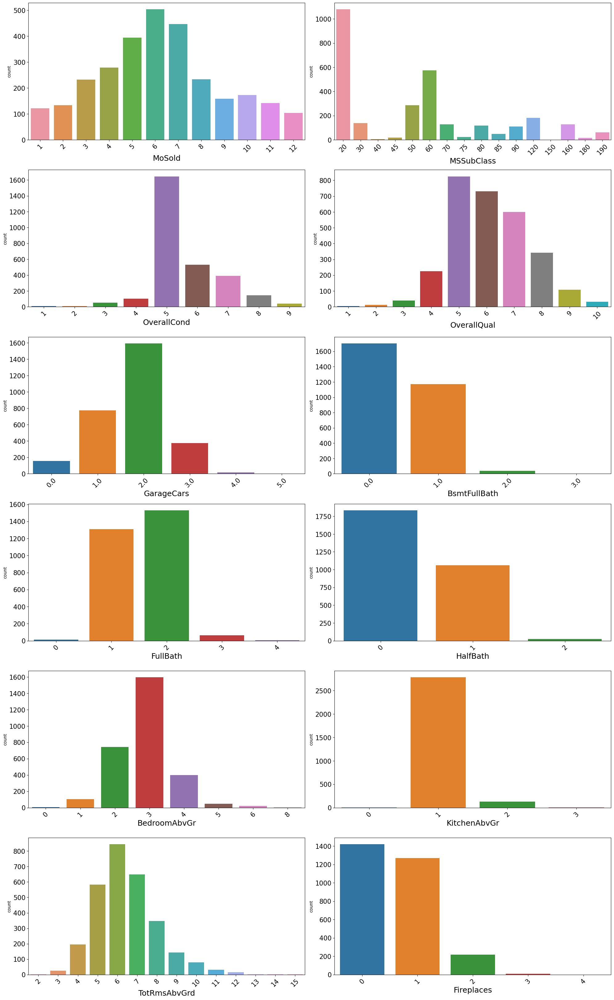

In [55]:
fig = plt.figure(figsize=(20,140))
for index,col in enumerate(num_but_cat.columns):
    plt.subplot(26,2,index+1)
    sns.countplot(x=num_but_cat.iloc[:,index], data=num_but_cat.dropna())
    plt.xlabel(col, fontsize = 18,color="black")

    plt.xticks(size = 15,color="black", rotation = 45 )
    plt.yticks(size = 15,color="black" )
    
fig.tight_layout(pad=1.0)

In [56]:
# Define a lambda function to map each month to its corresponding season
season_map = lambda x: "Winter" if x in [12, 1, 2] else \
                       "Spring" if x in [3, 4, 5] else \
                       "Summer" if x in [6, 7, 8] else \
                       "Fall" if x in [9, 10, 11] else None

# Apply the lambda function to create a new "season" column based on the "MoSold" column
train["sold_season"] = train["MoSold"].apply(season_map)

In [57]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,...,Alley_,BsmtType1_ratio,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio,sold_season
0,1,60,RL,65.0,8450,Absence,Reg,Lvl,Inside,CollgCr,...,No,0.824766,0.0,0.175234,0.000000,0.064852,0.007219,0.101302,0.000000,Winter
1,2,20,RL,80.0,9600,Absence,Reg,Lvl,rare_category,rare_category,...,No,0.774960,0.0,0.225040,0.000000,0.047917,0.000000,0.131458,0.031042,Spring
2,3,60,RL,68.0,11250,Absence,IR1,Lvl,Inside,CollgCr,...,No,0.528261,0.0,0.471739,0.000000,0.054044,0.003733,0.081778,0.000000,Fall
3,4,70,RL,60.0,9550,Absence,IR1,Lvl,Corner,rare_category,...,No,0.285714,0.0,0.714286,0.028482,0.067225,0.003665,0.079162,0.000000,Winter
4,5,60,RL,84.0,14260,Absence,IR1,Lvl,rare_category,rare_category,...,No,0.572052,0.0,0.427948,0.000000,0.058626,0.005891,0.080295,0.013464,Winter


### 2.1.D. Time Features

In [58]:
#validating date data 
year_data = train[['GarageYrBlt', 'YearBuilt', 'YearRemodAdd', 'YrSold']]
year_data.agg(['min','max'])

,GarageYrBlt,YearBuilt,YearRemodAdd,YrSold
min,1895.0,1872,1950,2006
max,2207.0,2010,2010,2010


In [59]:
#There are 9 observations that year garage was built earlier than original construction date. Is it possible?
check = train[train['GarageYrBlt'] < train['YearBuilt']]
check['GarageYrBlt'] = check['GarageYrBlt'].astype('int')
check[['GarageYrBlt', 'YearBuilt']]

<ipython-input-59-ef4ab3b0e552>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  check['GarageYrBlt'] = check['GarageYrBlt'].astype('int')


,GarageYrBlt,YearBuilt
29,1920,1927
93,1900,1910
324,1961,1967
600,2003,2005
736,1949,1950
1103,1954,1959
1376,1925,1930
1414,1922,1923
1418,1962,1963
61,1956,1959


In [60]:
##inconsistency
check_2 = train[train['YearRemodAdd'] < train['YearBuilt']]
check_2[['YearRemodAdd', 'YearBuilt']]

,YearRemodAdd,YearBuilt
416,2001,2002


In [61]:
#removed the inconsistency row
train = train.drop(416)

In [62]:
#check again
check_2 = train[train['YearRemodAdd'] < train['YearBuilt']]
check_2[['YearRemodAdd', 'YearBuilt']]

,YearRemodAdd,YearBuilt


In [63]:
#inconsistency
check_3 = train[train['YrSold'] < train['YearBuilt']]
check_3[['YrSold', 'YearBuilt']]

,YrSold,YearBuilt
1089,2007,2008


In [64]:
#removed the inconsistence row
train = train.drop(1089)

In [65]:
#ok
check_3 = train[train['YrSold'] < train['YearBuilt']]
check_3[['YrSold', 'YearBuilt']]

,YrSold,YearBuilt


In [66]:
#it seems that years are same as construction date if no remodeling or additions. Thats why we have decided to remove YearBuilt column.
check_4 = train[train['YearRemodAdd'] == train['YearBuilt']]
check_4[['YearRemodAdd', 'YearBuilt']]

,YearRemodAdd,YearBuilt
0,2003,2003
1,1976,1976
4,2000,2000
7,1973,1973
10,1965,1965
...,...,...
1452,1970,1970
1453,1970,1970
1454,1970,1970
1455,1970,1970


In [67]:
#We have changed the year columns to age by extracting from today(year).
import datetime

today = datetime.date.today()

year = today.year

print(year)

2023


In [68]:
train['AgeBuilt'] = year - train['YearRemodAdd']

print(train['AgeBuilt'].head())


0    20
1    47
2    21
3    53
4    23
Name: AgeBuilt, dtype: int64


In [69]:
train['AgeSale'] = year - train['YrSold']

print(train['AgeSale'].head())


0    15
1    16
2    15
3    17
4    15
Name: AgeSale, dtype: int64


In [70]:
#We have changed the missing values with 2023 due to missing values mean that there is no garage before we calculate the age of the garage. (We want to set 0 age of garage.)
train['GarageYrBlt'] = train['GarageYrBlt'].fillna('2023')

print(train['GarageYrBlt'].isnull().sum())


0


In [71]:
train['GarageYrBlt'] = train['GarageYrBlt'].astype(int)


In [72]:
train['AgeGarage'] = year - train['GarageYrBlt']


print(train['AgeGarage'].head())

0    20
1    47
2    22
3    25
4    23
Name: AgeGarage, dtype: int64


In [73]:
#removed the all year columns. (except YrSold due to there is possible to combine with month column)
train = train.drop(['YearBuilt','YearRemodAdd', 'GarageYrBlt','YrSold'], axis=1)

print(train.shape)


(2915, 79)


## 2.2 Correlation Analysis

In [74]:
train.corr()

<ipython-input-74-0bc27f030cd9>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  train.corr()


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio,AgeBuilt,AgeSale,AgeGarage
Id,1.000000,0.009729,-0.029058,-0.042784,-0.031005,-0.002060,-0.028043,-0.020998,0.018275,-0.015064,...,0.024641,0.004742,0.009994,0.008045,0.016310,0.008617,-0.000444,0.051135,0.257099,0.025158
MSSubClass,0.009729,1.000000,-0.416737,-0.200783,0.034056,-0.065771,0.007598,-0.062841,-0.072600,-0.125633,...,-0.055449,-0.027302,-0.004395,0.468867,0.199971,0.429037,0.220249,-0.043464,0.014232,-0.118490
LotFrontage,-0.029058,-0.416737,1.000000,0.487676,0.216447,-0.075582,0.216351,0.215601,0.047652,0.112273,...,0.013630,-0.052111,-0.064308,-0.367087,-0.111693,-0.441117,-0.169082,-0.091212,0.007911,-0.029447
LotArea,-0.042784,-0.200783,0.487676,1.000000,0.097820,-0.035085,0.118634,0.187015,0.084535,0.019672,...,0.045801,-0.080838,-0.061283,-0.331494,-0.118209,-0.386257,-0.120722,-0.020420,0.024117,0.037272
OverallQual,-0.031005,0.034056,0.216447,0.097820,1.000000,-0.093187,0.430971,0.276986,-0.042372,0.275212,...,-0.090772,-0.003261,-0.165446,0.259330,0.191827,0.216085,0.148986,-0.571041,0.018687,-0.408667
OverallCond,-0.002060,-0.065771,-0.075582,-0.035085,-0.093187,1.000000,-0.136284,-0.048872,0.041498,-0.138316,...,0.054492,-0.044637,0.108474,-0.102570,-0.068722,-0.102591,0.021305,-0.048350,-0.030560,0.293986
MasVnrArea,-0.028043,0.007598,0.216351,0.118634,0.430971,-0.136284,1.000000,0.292399,-0.015135,0.088055,...,-0.041550,-0.115229,-0.134900,0.140796,0.036787,0.111064,0.082660,-0.196065,0.017281,-0.187643
BsmtFinSF1,-0.020998,-0.062841,0.215601,0.187015,0.276986,-0.048872,0.292399,1.000000,-0.054627,-0.485552,...,-0.092027,-0.776866,-0.126105,0.044723,0.008952,0.129422,0.102845,-0.149752,-0.024286,-0.129995
BsmtFinSF2,0.018275,-0.072600,0.047652,0.084535,-0.042372,0.041498,-0.015135,-0.054627,1.000000,-0.238446,...,0.955032,-0.316972,-0.005282,-0.051220,-0.035860,-0.012586,0.042297,0.061921,-0.008648,0.082760
BsmtUnfSF,-0.015064,-0.125633,0.112273,0.019672,0.275212,-0.138316,0.088055,-0.485552,-0.238446,1.000000,...,-0.279690,0.812932,0.004493,0.007858,0.081406,0.176411,-0.072869,-0.165355,0.038020,-0.152987


<ipython-input-75-6382cdf84f25>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  ax=sns.heatmap(train.corr(), cmap='Greens', annot=True)


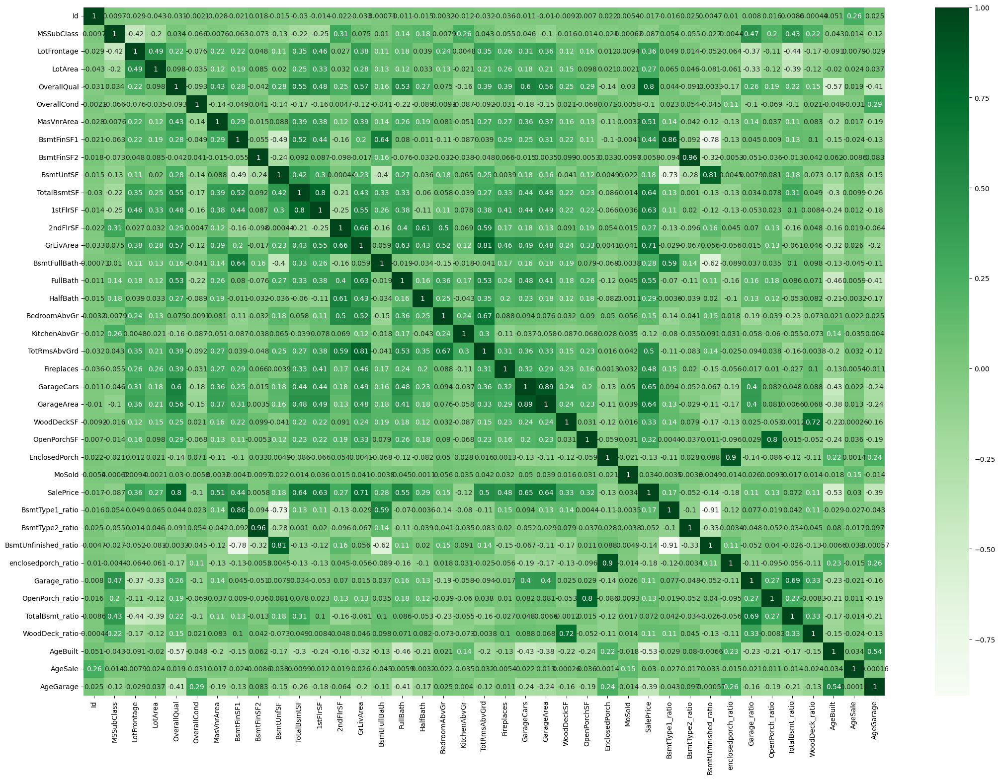

In [75]:
#checked correlations
plt.figure(figsize=(26,18))
ax=sns.heatmap(train.corr(), cmap='Greens', annot=True)
plt.show()

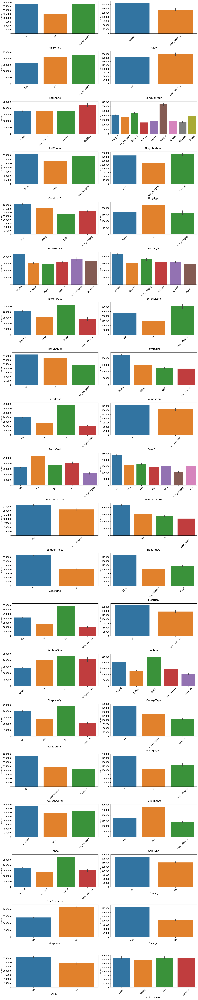

In [76]:
#Analysis of relationship between categorical variables and target variable
cat_3 = train.select_dtypes(include='object')
num_cols = cat_3.shape[1]  # get number of columns in cat_3

fig = plt.figure(figsize=(20, 5*num_cols))
for index,col in enumerate(cat_3.columns):
    plt.subplot(num_cols, 2, index+1)
    sns.barplot(x=cat_3[col], y=train['SalePrice'])
    plt.xlabel(col, fontsize=18, color="black")
    plt.xticks(size=15, color="black", rotation=45)
    plt.yticks(size=15, color="black")
    
fig.tight_layout(pad=1.0)

## 2.3 Feature Engineering

#### 2.3.A Missing Values

In [77]:
#checked missing values
null = pd.DataFrame(train.isnull().sum())
null = null.reset_index()
null = null.rename(columns={'index': 'Variables', 0:'Count'})
null['Proportion'] = null['Count']/len(train)
#checked only columns with null values
null_col = null[null['Count']>0].sort_values('Proportion', ascending=False)
null_col = null_col['Variables'].values

In [78]:
null[null['Count']>0].sort_values('Proportion', ascending=False)

,Variables,Count,Proportion
3,LotFrontage,486,0.166724
69,BsmtUnfinished_ratio,79,0.027101
68,BsmtType2_ratio,79,0.027101
67,BsmtType1_ratio,79,0.027101
18,MasVnrType,24,0.008233
19,MasVnrArea,23,0.007890
2,MSZoning,4,0.001372
45,Functional,2,0.000686
38,BsmtFullBath,2,0.000686
31,TotalBsmtSF,1,0.000343


In [79]:

train[null_col].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2915 entries, 0 to 1458
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   LotFrontage           2429 non-null   float64
 1   BsmtUnfinished_ratio  2836 non-null   float64
 2   BsmtType2_ratio       2836 non-null   float64
 3   BsmtType1_ratio       2836 non-null   float64
 4   MasVnrType            2891 non-null   object 
 5   MasVnrArea            2892 non-null   float64
 6   MSZoning              2911 non-null   object 
 7   Functional            2913 non-null   object 
 8   BsmtFullBath          2913 non-null   float64
 9   TotalBsmtSF           2914 non-null   float64
 10  Electrical            2914 non-null   object 
 11  BsmtUnfSF             2914 non-null   float64
 12  KitchenQual           2914 non-null   object 
 13  BsmtFinSF2            2914 non-null   float64
 14  GarageCars            2914 non-null   float64
 15  GarageArea           

<Figure size 1000x600 with 0 Axes>

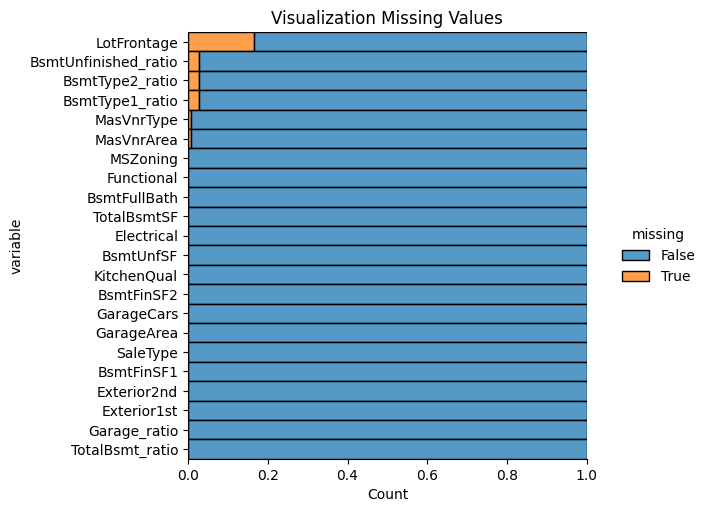

In [80]:
#first alternative categorical variables with null values
plt.figure(figsize=(10,6))
sns.displot(
    data=train[null_col].isnull().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25)
plt.title('Visualization Missing Values')
plt.show()

<Axes: >

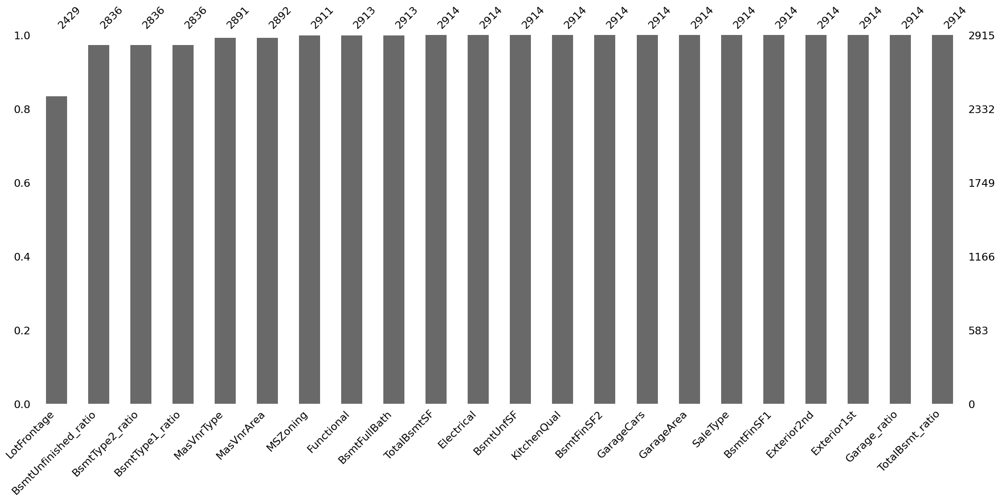

In [81]:
import missingno as msno
#Second alternative categorical variables with null values
msno.bar(train[null_col])

<Axes: >

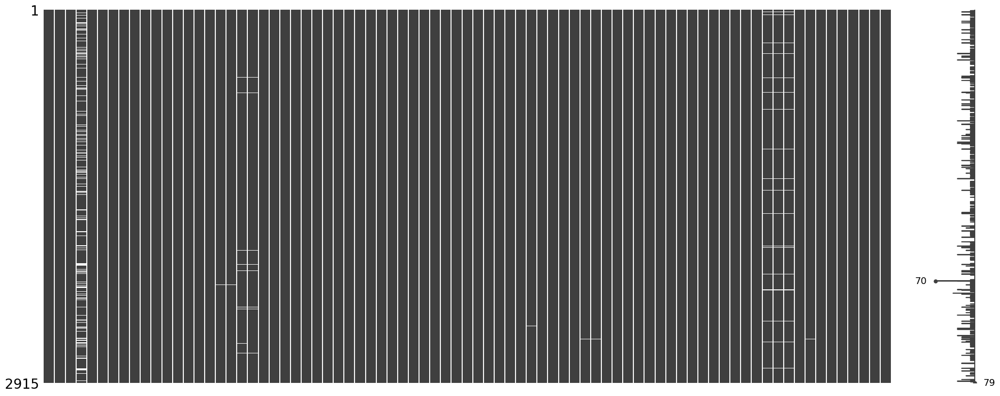

In [82]:
#checked whether missing values are at random.
msno.matrix(train)

<Axes: >

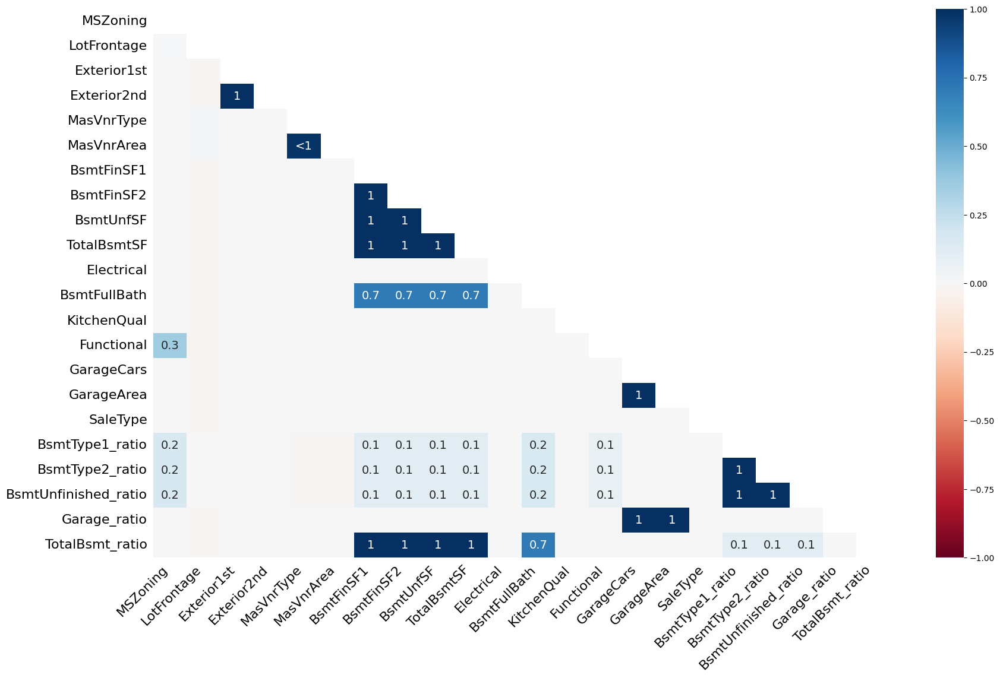

In [83]:
#Third alternative - shown graph of correlation of missing values between columns and explains the dependencies of missingness between columns
#https://medium.com/codex/how-to-identify-and-visualize-missing-values-with-python-3b304b06fe21
#the redder the color, the lower the correlation between missing values of the columns. The bluer it is, the higher the correlation of missingness.
#Close to -1: there is an anti-correlation between 2 columns: if column A has values, then column B has null values.
#Close to 0: no correlation due to the presence of null values between the columns
#Close to 1: strong correlation due to the presence of null values between the columns
msno.heatmap(train)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'LotFrontage'),
  Text(1, 0, 'BsmtUnfinished_ratio'),
  Text(2, 0, 'BsmtType2_ratio'),
  Text(3, 0, 'BsmtType1_ratio'),
  Text(4, 0, 'MasVnrArea'),
  Text(5, 0, 'BsmtFullBath'),
  Text(6, 0, 'TotalBsmtSF'),
  Text(7, 0, 'BsmtUnfSF'),
  Text(8, 0, 'BsmtFinSF2'),
  Text(9, 0, 'GarageCars'),
  Text(10, 0, 'GarageArea'),
  Text(11, 0, 'BsmtFinSF1'),
  Text(12, 0, 'Garage_ratio'),
  Text(13, 0, 'TotalBsmt_ratio')])

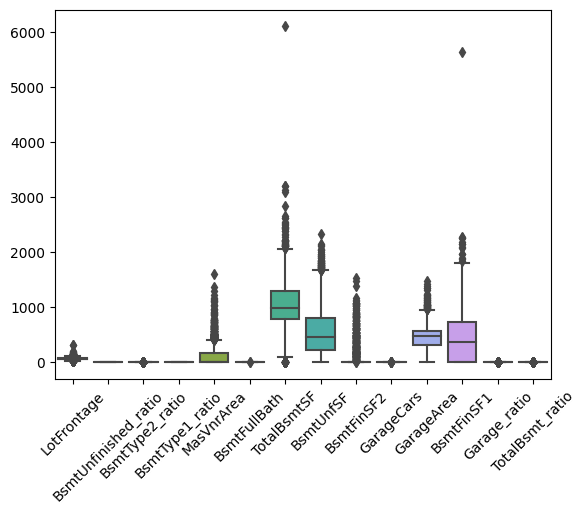

In [84]:
sns.boxplot(train[null_col])
plt.xticks(rotation=45)

In [85]:
train[null_col]

,LotFrontage,BsmtUnfinished_ratio,BsmtType2_ratio,BsmtType1_ratio,MasVnrType,MasVnrArea,MSZoning,Functional,BsmtFullBath,TotalBsmtSF,...,KitchenQual,BsmtFinSF2,GarageCars,GarageArea,SaleType,BsmtFinSF1,Exterior2nd,Exterior1st,Garage_ratio,TotalBsmt_ratio
0,65.0,0.175234,0.0,0.824766,BrkFace,196.0,RL,Typ,1.0,856.0,...,Gd,0.0,2.0,548.0,WD,706.0,VinylSd,VinylSd,0.064852,0.101302
1,80.0,0.225040,0.0,0.774960,None,0.0,RL,Typ,0.0,1262.0,...,TA,0.0,2.0,460.0,WD,978.0,MetalSd,MetalSd,0.047917,0.131458
2,68.0,0.471739,0.0,0.528261,BrkFace,162.0,RL,Typ,1.0,920.0,...,Gd,0.0,2.0,608.0,WD,486.0,VinylSd,VinylSd,0.054044,0.081778
3,60.0,0.714286,0.0,0.285714,None,0.0,RL,Typ,1.0,756.0,...,Gd,0.0,3.0,642.0,WD,216.0,rare_category,Wd Sdng,0.067225,0.079162
4,84.0,0.427948,0.0,0.572052,BrkFace,350.0,RL,Typ,1.0,1145.0,...,Gd,0.0,3.0,836.0,WD,655.0,VinylSd,VinylSd,0.058626,0.080295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,21.0,1.000000,0.0,0.000000,None,0.0,RM,Typ,0.0,546.0,...,TA,0.0,0.0,0.0,WD,0.0,rare_category,rare_category,0.000000,0.282025
1455,21.0,0.538462,0.0,0.461538,None,0.0,RM,Typ,0.0,546.0,...,TA,0.0,1.0,286.0,WD,252.0,rare_category,rare_category,0.151003,0.288279
1456,160.0,0.000000,0.0,1.000000,None,0.0,RL,Typ,1.0,1224.0,...,TA,0.0,2.0,576.0,WD,1224.0,VinylSd,VinylSd,0.028800,0.061200
1457,62.0,0.630482,0.0,0.369518,None,0.0,RL,Typ,0.0,912.0,...,TA,0.0,0.0,0.0,WD,337.0,rare_category,HdBoard,0.000000,0.087348


In [86]:
train[null_col].describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,2429.0,69.294772,23.324169,21.0,59.000000,68.000000,80.000000,313.000000
BsmtUnfinished_ratio,2836.0,0.550916,0.361482,0.0,0.234779,0.482787,1.000000,1.000000
BsmtType2_ratio,2836.0,0.047213,0.153878,0.0,0.000000,0.000000,0.000000,0.982609
BsmtType1_ratio,2836.0,0.401870,0.342793,0.0,0.000000,0.438348,0.716645,1.000000
MasVnrArea,2892.0,101.825726,178.219824,0.0,0.000000,0.000000,164.000000,1600.000000
BsmtFullBath,2913.0,0.429454,0.524716,0.0,0.000000,0.000000,1.000000,3.000000
TotalBsmtSF,2914.0,1050.323267,434.529194,0.0,793.000000,988.500000,1302.000000,6110.000000
BsmtUnfSF,2914.0,560.880233,439.626749,0.0,220.250000,467.500000,805.500000,2336.000000
BsmtFinSF2,2914.0,49.650309,169.311762,0.0,0.000000,0.000000,0.000000,1526.000000
GarageCars,2914.0,1.765957,0.761767,0.0,1.000000,2.000000,2.000000,5.000000


In [87]:
train[null_col].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2915 entries, 0 to 1458
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   LotFrontage           2429 non-null   float64
 1   BsmtUnfinished_ratio  2836 non-null   float64
 2   BsmtType2_ratio       2836 non-null   float64
 3   BsmtType1_ratio       2836 non-null   float64
 4   MasVnrType            2891 non-null   object 
 5   MasVnrArea            2892 non-null   float64
 6   MSZoning              2911 non-null   object 
 7   Functional            2913 non-null   object 
 8   BsmtFullBath          2913 non-null   float64
 9   TotalBsmtSF           2914 non-null   float64
 10  Electrical            2914 non-null   object 
 11  BsmtUnfSF             2914 non-null   float64
 12  KitchenQual           2914 non-null   object 
 13  BsmtFinSF2            2914 non-null   float64
 14  GarageCars            2914 non-null   float64
 15  GarageArea           

In [88]:
from sklearn.impute import SimpleImputer

# Get the list of numeric and categorical columns
num_cols = train.select_dtypes(exclude=['object']).columns.tolist()
cat_cols = train.select_dtypes(include=['object']).columns.tolist()

# Impute the median for numeric columns and mode for categorical columns
imp_num = SimpleImputer(strategy='median')
imp_cat = SimpleImputer(strategy='most_frequent')

train[num_cols] = imp_num.fit_transform(train[num_cols])
train[cat_cols] = imp_cat.fit_transform(train[cat_cols])


In [89]:
train[null_col].describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,2915.0,69.078902,21.295965,21.0,60.000000,68.000000,78.000000,313.000000
BsmtUnfinished_ratio,2915.0,0.549070,0.356720,0.0,0.238919,0.482787,1.000000,1.000000
BsmtType2_ratio,2915.0,0.045934,0.151972,0.0,0.000000,0.000000,0.000000,0.982609
BsmtType1_ratio,2915.0,0.402859,0.338166,0.0,0.000000,0.438348,0.708818,1.000000
MasVnrArea,2915.0,101.022298,177.743636,0.0,0.000000,0.000000,163.000000,1600.000000
BsmtFullBath,2915.0,0.429160,0.524657,0.0,0.000000,0.000000,1.000000,3.000000
TotalBsmtSF,2915.0,1050.302058,434.456138,0.0,793.000000,988.500000,1302.000000,6110.000000
BsmtUnfSF,2915.0,560.848199,439.554712,0.0,220.500000,467.500000,805.000000,2336.000000
BsmtFinSF2,2915.0,49.633276,169.285205,0.0,0.000000,0.000000,0.000000,1526.000000
GarageCars,2915.0,1.766038,0.761649,0.0,1.000000,2.000000,2.000000,5.000000


In [90]:
#!pip install impyute
#from impyute.imputation.cs import mice

# Define features to be used for imputing missing values
#features = one_hot_train.drop(['Id','SalePrice'], axis=1).columns.tolist()

# Apply MICE algorithm for imputing missing values
#imputed_arr = mice(one_hot_train[features].values)
#imputed_df = pd.DataFrame(imputed_arr, columns=features)

# Merge the imputed data with the original DataFrame
#one_hot_train[features] = imputed_df

# Check if the dataset contains any missing values after imputation
#print(one_hot_train.isnull().sum())

In [91]:
print(train.shape)


(2915, 79)


In [92]:
#checked missing values
null = pd.DataFrame(train.isnull().sum())
null = null.reset_index()
null = null.rename(columns={'index': 'Variables', 0:'Count'})
null['Proportion'] = null['Count']/len(train)
#checked only columns with null values
null[null['Count']>0].sort_values('Proportion', ascending=False)


,Variables,Count,Proportion


#### 2.3.B Outliers

In [93]:
num_cols = train.select_dtypes(exclude='object')
num_cols

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio,AgeBuilt,AgeSale,AgeGarage
0,1.0,60.0,65.0,8450.0,7.0,5.0,196.0,706.0,0.0,150.0,...,0.0,0.175234,0.000000,0.064852,0.007219,0.101302,0.000000,20.0,15.0,20.0
1,2.0,20.0,80.0,9600.0,6.0,8.0,0.0,978.0,0.0,284.0,...,0.0,0.225040,0.000000,0.047917,0.000000,0.131458,0.031042,47.0,16.0,47.0
2,3.0,60.0,68.0,11250.0,7.0,5.0,162.0,486.0,0.0,434.0,...,0.0,0.471739,0.000000,0.054044,0.003733,0.081778,0.000000,21.0,15.0,22.0
3,4.0,70.0,60.0,9550.0,7.0,5.0,0.0,216.0,0.0,540.0,...,0.0,0.714286,0.028482,0.067225,0.003665,0.079162,0.000000,53.0,17.0,25.0
4,5.0,60.0,84.0,14260.0,8.0,5.0,350.0,655.0,0.0,490.0,...,0.0,0.427948,0.000000,0.058626,0.005891,0.080295,0.013464,23.0,15.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915.0,160.0,21.0,1936.0,4.0,7.0,0.0,0.0,0.0,546.0,...,0.0,1.000000,0.000000,0.000000,0.000000,0.282025,0.000000,53.0,17.0,0.0
1455,2916.0,160.0,21.0,1894.0,4.0,5.0,0.0,252.0,0.0,294.0,...,0.0,0.538462,0.000000,0.151003,0.012672,0.288279,0.000000,53.0,17.0,53.0
1456,2917.0,20.0,160.0,20000.0,5.0,7.0,0.0,1224.0,0.0,0.0,...,0.0,0.000000,0.000000,0.028800,0.000000,0.061200,0.023700,27.0,17.0,63.0
1457,2918.0,85.0,62.0,10441.0,5.0,5.0,0.0,337.0,0.0,575.0,...,0.0,0.630482,0.000000,0.000000,0.003065,0.087348,0.007662,31.0,17.0,0.0


In [94]:
num_cols.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2915.0,1459.967753,842.838839,1.0,730.500000,1460.000000,2189.500000,2919.000000
MSSubClass,2915.0,57.140652,42.519697,20.0,20.000000,50.000000,70.000000,190.000000
LotFrontage,2915.0,69.078902,21.295965,21.0,60.000000,68.000000,78.000000,313.000000
LotArea,2915.0,10161.075815,7872.797070,1300.0,7478.000000,9453.000000,11570.000000,215245.000000
OverallQual,2915.0,6.086792,1.408505,1.0,5.000000,6.000000,7.000000,10.000000
OverallCond,2915.0,5.564666,1.113430,1.0,5.000000,5.000000,6.000000,9.000000
MasVnrArea,2915.0,101.022298,177.743636,0.0,0.000000,0.000000,163.000000,1600.000000
BsmtFinSF1,2915.0,439.768096,450.614446,0.0,0.000000,368.000000,732.500000,5644.000000
BsmtFinSF2,2915.0,49.633276,169.285205,0.0,0.000000,0.000000,0.000000,1526.000000
BsmtUnfSF,2915.0,560.848199,439.554712,0.0,220.500000,467.500000,805.000000,2336.000000


In [95]:
num_cols_original = num_cols.drop(['MSSubClass','OverallQual','OverallCond','BsmtFullBath','FullBath',
                        'HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','MoSold'], axis=1)


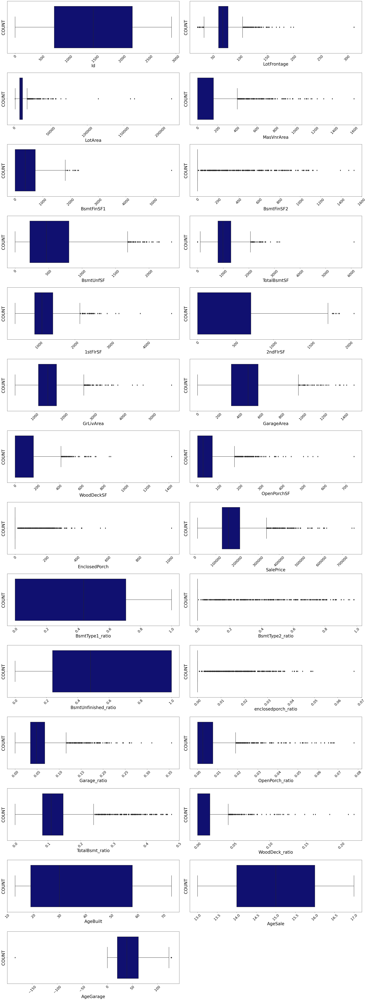

In [96]:
fig = plt.figure(figsize=(30,150))
for index,col in enumerate(num_cols_original):
    plt.subplot(26,2,index+1)
    sns.boxplot(x=col, data=num_cols_original.dropna(), color='navy')
    plt.ylabel('COUNT', size = 25,color="black" )
    plt.xlabel(col, fontsize = 25,color="black" )
    plt.xticks(size = 20,color="black", rotation = 45 )
    plt.yticks(size = 20,color="black" )
    
fig.tight_layout(pad=1.0)

In [97]:
num_cols_original

,Id,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,BsmtType2_ratio,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio,AgeBuilt,AgeSale,AgeGarage
0,1.0,65.0,8450.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,...,0.0,0.175234,0.000000,0.064852,0.007219,0.101302,0.000000,20.0,15.0,20.0
1,2.0,80.0,9600.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,...,0.0,0.225040,0.000000,0.047917,0.000000,0.131458,0.031042,47.0,16.0,47.0
2,3.0,68.0,11250.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,...,0.0,0.471739,0.000000,0.054044,0.003733,0.081778,0.000000,21.0,15.0,22.0
3,4.0,60.0,9550.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,...,0.0,0.714286,0.028482,0.067225,0.003665,0.079162,0.000000,53.0,17.0,25.0
4,5.0,84.0,14260.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,...,0.0,0.427948,0.000000,0.058626,0.005891,0.080295,0.013464,23.0,15.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915.0,21.0,1936.0,0.0,0.0,0.0,546.0,546.0,546.0,546.0,...,0.0,1.000000,0.000000,0.000000,0.000000,0.282025,0.000000,53.0,17.0,0.0
1455,2916.0,21.0,1894.0,0.0,252.0,0.0,294.0,546.0,546.0,546.0,...,0.0,0.538462,0.000000,0.151003,0.012672,0.288279,0.000000,53.0,17.0,53.0
1456,2917.0,160.0,20000.0,0.0,1224.0,0.0,0.0,1224.0,1224.0,0.0,...,0.0,0.000000,0.000000,0.028800,0.000000,0.061200,0.023700,27.0,17.0,63.0
1457,2918.0,62.0,10441.0,0.0,337.0,0.0,575.0,912.0,970.0,0.0,...,0.0,0.630482,0.000000,0.000000,0.003065,0.087348,0.007662,31.0,17.0,0.0


In [98]:
#def adjusted_quartiles(col):
#    median = np.median(col)
#   mad = np.median(np.abs(col - median))
 #   q1 = np.median(col[col <= median - 1.5 * mad])
  #  q3 = np.median(col[col >= median + 1.5 * mad])
   # return q1, q3

#def outlier_thresholds(dataframe, col_name):
#    q1, q3 = adjusted_quartiles(dataframe[col_name])
 #   quartile1 = q1
  #  quartile3 = q3
   # interquantile_range = quartile3 - quartile1
   # up_limit = quartile3 + 1.5 * interquantile_range
    #low_limit = quartile1 - 1.5 * interquantile_range
    #return low_limit, up_limit

#for col in num_cols_original.iloc[:,1:].columns:
 #   print(col, outlier_thresholds(train, col))


In [99]:
def outlier_thresholds(dataframe, col_name, q1=0.10, q3=0.90):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit


for col in num_cols_original.iloc[:,1:].columns:
    print(col, outlier_thresholds(train, col))

LotFrontage (-17.999999999999915, 156.39999999999995)
LotArea (-9136.900000000001, 28361.5)
MasVnrArea (-481.7999999999997, 802.9999999999995)
BsmtFinSF1 (-1584.0, 2640.0)
BsmtFinSF2 (-189.29999999999973, 315.49999999999955)
BsmtUnfSF (-1679.7999999999997, 2948.9999999999995)
TotalBsmtSF (-919.7999999999997, 3132.9999999999995)
1stFlrSF (-647.9999999999999, 3068.8)
2ndFlrSF (-1387.5, 2312.5)
GrLivArea (-920.3999999999996, 3996.3999999999996)
GarageArea (-536.3999999999999, 1533.9999999999998)
WoodDeckSF (-384.89999999999986, 641.4999999999998)
OpenPorchSF (-196.5, 327.5)
EnclosedPorch (-168.0, 280.0)
SalePrice (-159577.79999999993, 545962.9999999999)
BsmtType1_ratio (-1.2807936078006499, 2.1346560130010834)
BsmtType2_ratio (-0.17759239607237637, 0.29598732678729395)
BsmtUnfinished_ratio (-1.2538638157159936, 2.352318289429596)
enclosedporch_ratio (-0.018509004766389815, 0.03084834127731636)
Garage_ratio (-0.08454630389731695, 0.20255787723219948)
OpenPorch_ratio (-0.02243508802484724, 

In [100]:
# With the x function, we can confirm the existence of outliers in our variables.

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

    
    
for col in num_cols_original.iloc[:,1:]:
    print(col, check_outlier(train, col))

LotFrontage True
LotArea True
MasVnrArea True
BsmtFinSF1 True
BsmtFinSF2 True
BsmtUnfSF False
TotalBsmtSF True
1stFlrSF True
2ndFlrSF False
GrLivArea True
GarageArea False
WoodDeckSF True
OpenPorchSF True
EnclosedPorch True
SalePrice True
BsmtType1_ratio False
BsmtType2_ratio True
BsmtUnfinished_ratio False
enclosedporch_ratio True
Garage_ratio True
OpenPorch_ratio True
TotalBsmt_ratio True
WoodDeck_ratio True
AgeBuilt False
AgeSale False
AgeGarage True


In [101]:
# We suppress our outliers with the 'replace_with_thresholds' function.
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

for col in num_cols_original.iloc[:,1:]:
    replace_with_thresholds(train, col)
    
# When we check for outliers with the y function, we observe the result.   
for col in num_cols_original.iloc[:,1:]:
    print(col, check_outlier(train, col))

LotFrontage False
LotArea False
MasVnrArea False
BsmtFinSF1 False
BsmtFinSF2 False
BsmtUnfSF False
TotalBsmtSF False
1stFlrSF False
2ndFlrSF False
GrLivArea False
GarageArea False
WoodDeckSF False
OpenPorchSF False
EnclosedPorch False
SalePrice False
BsmtType1_ratio False
BsmtType2_ratio False
BsmtUnfinished_ratio False
enclosedporch_ratio False
Garage_ratio False
OpenPorch_ratio False
TotalBsmt_ratio False
WoodDeck_ratio False
AgeBuilt False
AgeSale False
AgeGarage False


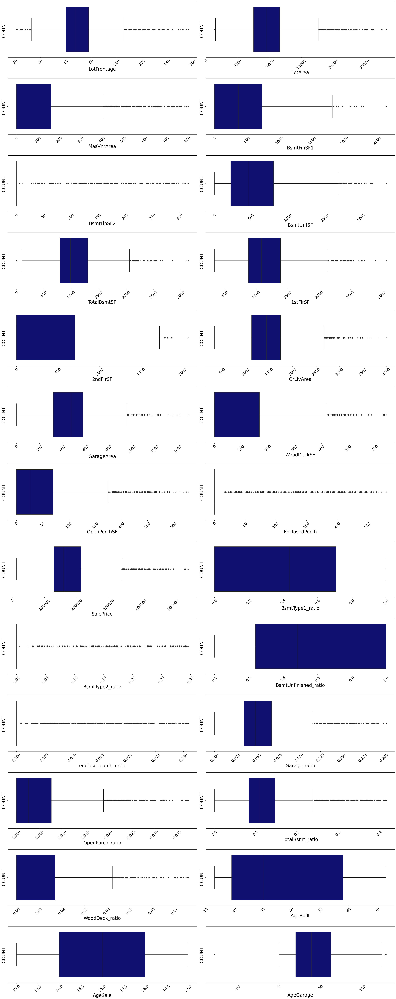

In [102]:
fig = plt.figure(figsize=(30,150))
for index,col in enumerate(num_cols_original.iloc[:,1:]):
    plt.subplot(26,2,index+1)
    sns.boxplot(x=col, data=train.dropna(), color='navy')
    plt.ylabel('COUNT', size = 25,color="black" )
    plt.xlabel(col, fontsize = 25,color="black" )
    plt.xticks(size = 20,color="black", rotation = 45 )
    plt.yticks(size = 20,color="black" )
    
fig.tight_layout(pad=1.0)

In [103]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2915.0,1459.967753,842.838839,1.0,730.500000,1460.000000,2189.500000,2919.000000
MSSubClass,2915.0,57.140652,42.519697,20.0,20.000000,50.000000,70.000000,190.000000
LotFrontage,2915.0,68.914717,20.157267,21.0,60.000000,68.000000,78.000000,156.400000
LotArea,2915.0,9814.247341,4338.798622,1300.0,7478.000000,9453.000000,11570.000000,28361.500000
OverallQual,2915.0,6.086792,1.408505,1.0,5.000000,6.000000,7.000000,10.000000
OverallCond,2915.0,5.564666,1.113430,1.0,5.000000,5.000000,6.000000,9.000000
MasVnrArea,2915.0,98.908748,166.782732,0.0,0.000000,0.000000,163.000000,803.000000
BsmtFinSF1,2915.0,438.737564,442.062398,0.0,0.000000,368.000000,732.500000,2640.000000
BsmtFinSF2,2915.0,29.435163,86.136601,0.0,0.000000,0.000000,0.000000,315.500000
BsmtUnfSF,2915.0,560.848199,439.554712,0.0,220.500000,467.500000,805.000000,2336.000000


In [104]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,Neighborhood,...,BsmtUnfinished_ratio,enclosedporch_ratio,Garage_ratio,OpenPorch_ratio,TotalBsmt_ratio,WoodDeck_ratio,sold_season,AgeBuilt,AgeSale,AgeGarage
0,1.0,60.0,RL,65.0,8450.0,Absence,Reg,Lvl,Inside,CollgCr,...,0.175234,0.000000,0.064852,0.007219,0.101302,0.000000,Winter,20.0,15.0,20.0
1,2.0,20.0,RL,80.0,9600.0,Absence,Reg,Lvl,rare_category,rare_category,...,0.225040,0.000000,0.047917,0.000000,0.131458,0.031042,Spring,47.0,16.0,47.0
2,3.0,60.0,RL,68.0,11250.0,Absence,IR1,Lvl,Inside,CollgCr,...,0.471739,0.000000,0.054044,0.003733,0.081778,0.000000,Fall,21.0,15.0,22.0
3,4.0,70.0,RL,60.0,9550.0,Absence,IR1,Lvl,Corner,rare_category,...,0.714286,0.028482,0.067225,0.003665,0.079162,0.000000,Winter,53.0,17.0,25.0
4,5.0,60.0,RL,84.0,14260.0,Absence,IR1,Lvl,rare_category,rare_category,...,0.427948,0.000000,0.058626,0.005891,0.080295,0.013464,Winter,23.0,15.0,23.0


In [105]:
train.dtypes

Id                float64
MSSubClass        float64
MSZoning           object
LotFrontage       float64
LotArea           float64
                   ...   
WoodDeck_ratio    float64
sold_season        object
AgeBuilt          float64
AgeSale           float64
AgeGarage         float64
Length: 79, dtype: object

#### 2.3.C Encoding (Label and One Hot)

In [106]:
# TRAIN
from sklearn.preprocessing import LabelEncoder

binary_cols = [col for col in train.columns if train[col].dtypes == "O" and train[col].nunique() == 2]
binary_cols

# Binary kolonlar label encoder yapacağız.
labelencoder = LabelEncoder()

for col in binary_cols:
    labelencoder = LabelEncoder()
    train[col] = labelencoder.fit_transform(train[col])

In [107]:
train.shape

(2915, 79)

In [108]:
from sklearn.base import TransformerMixin
# TRAIN - Kategorik kolonlar için one hot encoder uygulayacağız.
num_cols = [col for col in train.columns if train[col].dtype != 'object']
cat_cols = [col for col in cat_cols if col not in binary_cols and col not in num_cols]
cat_cols

encode_train = pd.get_dummies(train, columns=cat_cols, drop_first=True)

In [109]:
encode_train.shape

(2915, 140)

#### 2.3.D. Feature Transformation

##### 2.3.D.1 Scaling (MinMax)

In [110]:
encode_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2915 entries, 0 to 1458
Columns: 140 entries, Id to sold_season_Winter
dtypes: float64(39), int64(10), uint8(91)
memory usage: 1.4 MB


In [111]:
encode_train.iloc[:,1:]

,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,MasVnrArea,BsmtCond,BsmtFinSF1,...,Fence_MnPrv,Fence_rare_category,SaleType_WD,SaleType_rare_category,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category,sold_season_Spring,sold_season_Summer,sold_season_Winter
0,60.0,65.0,8450.0,0,0,7.0,5.0,196.0,0,706.0,...,0,0,1,0,1,0,0,0,0,1
1,20.0,80.0,9600.0,0,0,6.0,8.0,0.0,0,978.0,...,0,0,1,0,1,0,0,1,0,0
2,60.0,68.0,11250.0,0,0,7.0,5.0,162.0,0,486.0,...,0,0,1,0,1,0,0,0,0,0
3,70.0,60.0,9550.0,0,0,7.0,5.0,0.0,1,216.0,...,0,0,1,0,0,0,0,0,0,1
4,60.0,84.0,14260.0,0,0,8.0,5.0,350.0,0,655.0,...,0,0,1,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,160.0,21.0,1936.0,0,0,4.0,7.0,0.0,0,0.0,...,0,0,1,0,1,0,0,0,1,0
1455,160.0,21.0,1894.0,0,0,4.0,5.0,0.0,0,252.0,...,0,0,1,0,0,0,0,1,0,0
1456,20.0,156.4,20000.0,0,0,5.0,7.0,0.0,0,1224.0,...,0,0,1,0,0,0,0,0,0,0
1457,85.0,62.0,10441.0,0,0,5.0,5.0,0.0,0,337.0,...,1,0,1,0,1,0,0,0,1,0


In [112]:
encode_train.iloc[:,1:].describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,2915.0,57.140652,42.519697,20.0,20.0,50.0,70.0,190.0
LotFrontage,2915.0,68.914717,20.157267,21.0,60.0,68.0,78.0,156.4
LotArea,2915.0,9814.247341,4338.798622,1300.0,7478.0,9453.0,11570.0,28361.5
Alley,2915.0,0.067581,0.251069,0.0,0.0,0.0,0.0,1.0
LandContour,2915.0,0.101544,0.302099,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...
SaleCondition_Partial,2915.0,0.083705,0.276992,0.0,0.0,0.0,0.0,1.0
SaleCondition_rare_category,2915.0,0.028130,0.165374,0.0,0.0,0.0,0.0,1.0
sold_season_Spring,2915.0,0.309434,0.462340,0.0,0.0,0.0,1.0,1.0
sold_season_Summer,2915.0,0.405489,0.491071,0.0,0.0,0.0,1.0,1.0


In [113]:
encode_train.index.duplicated().any()

True

In [114]:
encode_train = encode_train.reset_index(drop=True)

In [115]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Select the numerical columns to be scaled (excluding the id column)
numerical_columns = encode_train.select_dtypes(include=np.number).columns
numerical_columns = numerical_columns.drop('Id')
numerical_columns_data = encode_train[numerical_columns]

# Fit the scaler to the numerical columns
scaler.fit(numerical_columns_data)

# Scale the numerical columns using the scaler
scaled_numerical_columns_data = pd.DataFrame(scaler.transform(numerical_columns_data), columns=numerical_columns)

# Concatenate the scaled numerical columns with the id column to create the final scaled dataframe
scaled_train = pd.concat([encode_train['Id'], scaled_numerical_columns_data], axis=1)

In [116]:
scaled_train.head()

,Id,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,MasVnrArea,BsmtCond,...,Fence_MnPrv,Fence_rare_category,SaleType_WD,SaleType_rare_category,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category,sold_season_Spring,sold_season_Summer,sold_season_Winter
0,1.0,0.235294,0.324963,0.264213,0.0,0.0,0.666667,0.500,0.244085,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,2.0,0.000000,0.435746,0.306709,0.0,0.0,0.555556,0.875,0.000000,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3.0,0.235294,0.347120,0.367681,0.0,0.0,0.666667,0.500,0.201743,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,4.0,0.294118,0.288035,0.304861,0.0,0.0,0.666667,0.500,0.000000,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,5.0,0.235294,0.465288,0.478909,0.0,0.0,0.777778,0.500,0.435866,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [117]:
scaled_train.index.duplicated().any()

False

In [118]:
scaled_train.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2915.0,1459.967753,842.838839,1.0,730.500000,1460.000000,2189.500000,2919.0
MSSubClass,2915.0,0.218474,0.250116,0.0,0.000000,0.176471,0.294118,1.0
LotFrontage,2915.0,0.353875,0.148872,0.0,0.288035,0.347120,0.420975,1.0
LotArea,2915.0,0.314626,0.160331,0.0,0.228295,0.301277,0.379506,1.0
Alley,2915.0,0.067581,0.251069,0.0,0.000000,0.000000,0.000000,1.0
...,...,...,...,...,...,...,...,...
SaleCondition_Partial,2915.0,0.083705,0.276992,0.0,0.000000,0.000000,0.000000,1.0
SaleCondition_rare_category,2915.0,0.028130,0.165374,0.0,0.000000,0.000000,0.000000,1.0
sold_season_Spring,2915.0,0.309434,0.462340,0.0,0.000000,0.000000,1.000000,1.0
sold_season_Summer,2915.0,0.405489,0.491071,0.0,0.000000,0.000000,1.000000,1.0


##### 2.3.D.2 Log-Transformation

In [119]:
# Define a function to detect skewed columns and apply log transformation
def log_transform(df, threshold=0.5):
    # Get the skewness of each numerical column (excluding 'Id')
    numerical_cols = df.select_dtypes(include=np.number).drop('Id', axis=1).columns
    skewness = df[numerical_cols].apply(lambda x: x.skew())
    
    # Identify the columns with skewness greater than the threshold
    skewed_cols = skewness[abs(skewness) > threshold].index
    
    # Apply log transformation to the skewed columns
    df[skewed_cols] = np.log1p(df[skewed_cols])
    
    return df

# Call the log_transform function on your DataFrame
scaled_and_transformed = log_transform(scaled_train)

# Add the 'Id' column back to the DataFrame
#scaled_and_transformed = pd.concat([encode_train['Id'], scaled_and_transformed], axis=1)

In [120]:
scaled_and_transformed.head()

,Id,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,MasVnrArea,BsmtCond,...,Fence_MnPrv,Fence_rare_category,SaleType_WD,SaleType_rare_category,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category,sold_season_Spring,sold_season_Summer,sold_season_Winter
0,1.0,0.211309,0.281385,0.234450,0.0,0.0,0.666667,0.405465,0.218400,0.000000,...,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.000000,0.0,0.693147
1,2.0,0.000000,0.361685,0.267512,0.0,0.0,0.555556,0.628609,0.000000,0.000000,...,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147,0.0,0.000000
2,3.0,0.211309,0.297969,0.313117,0.0,0.0,0.666667,0.405465,0.183773,0.000000,...,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.000000,0.0,0.000000
3,4.0,0.257829,0.253118,0.266097,0.0,0.0,0.666667,0.405465,0.000000,0.693147,...,0.0,0.0,0.693147,0.0,0.000000,0.0,0.0,0.000000,0.0,0.693147
4,5.0,0.211309,0.382052,0.391305,0.0,0.0,0.777778,0.405465,0.361768,0.000000,...,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.000000,0.0,0.693147


In [121]:
scaled_and_transformed.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2915.0,1459.967753,842.838839,1.0,730.500000,1460.000000,2189.500000,2919.000000
MSSubClass,2915.0,0.179082,0.186845,0.0,0.000000,0.162519,0.257829,0.693147
LotFrontage,2915.0,0.297024,0.108991,0.0,0.253118,0.297969,0.351343,0.693147
LotArea,2915.0,0.266628,0.116047,0.0,0.205627,0.263346,0.321725,0.693147
Alley,2915.0,0.046844,0.174028,0.0,0.000000,0.000000,0.000000,0.693147
...,...,...,...,...,...,...,...,...
SaleCondition_Partial,2915.0,0.058020,0.191996,0.0,0.000000,0.000000,0.000000,0.693147
SaleCondition_rare_category,2915.0,0.019498,0.114628,0.0,0.000000,0.000000,0.000000,0.693147
sold_season_Spring,2915.0,0.214483,0.320469,0.0,0.000000,0.000000,0.693147,0.693147
sold_season_Summer,2915.0,0.405489,0.491071,0.0,0.000000,0.000000,1.000000,1.000000


In [122]:
scaled_and_transformed.corr()['SalePrice'].sort_values(ascending=False)


SalePrice           1.000000
OverallQual         0.822346
GrLivArea           0.727843
GarageCars          0.671791
TotalBsmtSF         0.660740
                      ...   
GarageFinish_Unf   -0.439110
BsmtQual_TA        -0.469675
KitchenQual_TA     -0.546862
AgeBuilt           -0.561951
ExterQual_TA       -0.608801
Name: SalePrice, Length: 140, dtype: float64

# 3.Feature Selection

In [123]:
id_col = scaled_and_transformed['Id']  # Id kolonunu ayrı bir değişkende sakla
scaled_and_transformed = scaled_and_transformed.set_index('Id')  # Id kolonunu indeks olarak ayır

In [124]:
from sklearn.model_selection import train_test_split

X = scaled_and_transformed.drop('SalePrice', axis=1)
y = scaled_and_transformed['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [125]:
X_train.head()

,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,MasVnrArea,BsmtCond,BsmtFinSF1,...,Fence_MnPrv,Fence_rare_category,SaleType_WD,SaleType_rare_category,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category,sold_season_Spring,sold_season_Summer,sold_season_Winter
Id,,,,,,,,,,,,,,,,,,,,,
1870.0,0.0,0.436013,0.287779,0.0,0.0,0.777778,0.405465,0.160712,0.0,0.285407,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.693147,0.0,0.0
2167.0,0.0,0.297969,0.241615,0.0,0.0,0.666667,0.405465,0.171260,0.0,0.402430,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.693147,0.0,0.0
2539.0,0.0,0.281385,0.243731,0.0,0.0,0.666667,0.405465,0.000000,0.0,0.237883,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.000000,0.0,0.0
899.0,0.0,0.459610,0.357224,0.0,0.0,0.888889,0.405465,0.666008,0.0,0.603653,...,0.0,0.0,0.000000,0.0,0.000000,0.693147,0.0,0.693147,0.0,0.0
1262.0,0.0,0.361685,0.267512,0.0,0.0,0.444444,0.485508,0.000000,0.0,0.174717,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.000000,1.0,0.0


In [126]:
X_test.head()

,MSSubClass,LotFrontage,LotArea,Alley,LandContour,OverallQual,OverallCond,MasVnrArea,BsmtCond,BsmtFinSF1,...,Fence_MnPrv,Fence_rare_category,SaleType_WD,SaleType_rare_category,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_rare_category,sold_season_Spring,sold_season_Summer,sold_season_Winter
Id,,,,,,,,,,,,,,,,,,,,,
1506.0,0.000000,0.297969,0.291430,0.0,0.0,0.555556,0.485508,0.139275,0.0,0.175353,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.693147,0.0,0.0
1862.0,0.344840,0.297969,0.329331,0.0,0.0,0.666667,0.405465,0.028240,0.0,0.270490,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.000000,0.0,0.0
2360.0,0.000000,0.275795,0.169076,0.0,0.0,0.444444,0.405465,0.000000,0.0,0.050952,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.693147,0.0,0.0
687.0,0.211309,0.382052,0.284532,0.0,0.0,0.666667,0.485508,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.693147,0.0,0.000000,1.0,0.0
1643.0,0.211309,0.297969,0.206289,0.0,0.0,0.777778,0.405465,0.000000,0.0,0.000000,...,0.0,0.0,0.693147,0.0,0.693147,0.000000,0.0,0.693147,0.0,0.0


In [127]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(2332, 138)
(2332,)
(583, 138)
(583,)


In [128]:
y_train

Id
1870.0    0.330751
2167.0    0.336395
2539.0    0.263458
899.0     0.693147
1262.0    0.197024
            ...   
1641.0    0.278477
1098.0    0.258402
1133.0    0.179310
1297.0    0.236435
862.0     0.201020
Name: SalePrice, Length: 2332, dtype: float64

In [129]:
y_train.shape

(2332,)

## 3.3.Random Forest (Feature Importance)

Feature ranking:
1. OverallQual: 0.6355997028319192
2. GrLivArea: 0.10887951791527904
3. 1stFlrSF: 0.02902286877769872
4. TotalBsmtSF: 0.028150315795051235
5. BsmtFinSF1: 0.024113104871773136
6. FullBath: 0.022621148422463603
7. AgeBuilt: 0.013560669455700626
8. GarageArea: 0.01329214214015966
9. LotArea: 0.012217861075038519
10. GarageCars: 0.008039518026042034
11. Garage_ratio: 0.00455689815153892
12. AgeGarage: 0.0045195326862940855
13. BsmtQual_Gd: 0.00433851098474843
14. LotFrontage: 0.004269731705056529
15. MSZoning_RM: 0.004230621282423249
16. 2ndFlrSF: 0.004002252875122455
17. OverallCond: 0.00399406778590445
18. CentralAir: 0.0036097855082470255
19. BsmtUnfSF: 0.0031057352026617148
20. TotalBsmt_ratio: 0.0029064563034867526
21. OpenPorchSF: 0.002802367666351226
22. MasVnrArea: 0.0026867853736200764
23. BsmtUnfinished_ratio: 0.0026280833806805255
24. KitchenQual_Gd: 0.002396376594185921
25. WoodDeckSF: 0.0021134465280588373
26. OpenPorch_ratio: 0.00203609779036798
27. BsmtType1

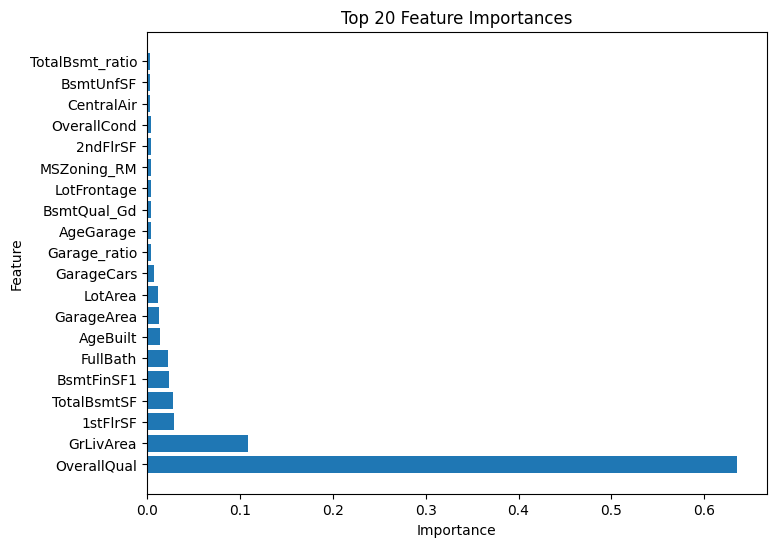

In [131]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Create a random forest regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the random forest regressor to the training data
rf.fit(X_train, y_train)

# Calculate feature importance on the test set
importances = rf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
for f in range(X_train.shape[1]):
    print(f"{f+1}. {X_train.columns[indices[f]]}: {importances[indices[f]]}")

# Select the top k features based on their importance scores
k = 20
top_k_features = X_train.columns[indices[:k]]

# Train a new random forest model using only the top k features
rf_top_k = RandomForestRegressor(n_estimators=100, random_state=42)
rf_top_k.fit(X_train[top_k_features], y_train)

# Evaluate the model's performance on the testing set
y_pred = rf_top_k.predict(X_test[top_k_features])
mse = mean_squared_error(y_test, y_pred)
print(f"Mean squared error on testing set using {k} features: {mse}")

# Plot feature importances
fig, ax = plt.subplots(figsize=(8, 6))
ax.barh(top_k_features, importances[indices][:k])
ax.set_title(f"Top {k} Feature Importances")
ax.set_xlabel("Importance")
ax.set_ylabel("Feature")
plt.show()

## 3.2.RFE

In [132]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

# Define the number of features to select
n_features = 20

# Define the estimator for feature selection
estimator = LinearRegression()

# Define the RFE selector with the chosen estimator and number of features to select
selector = RFE(estimator=estimator, n_features_to_select=n_features, step=1)

# Fit the selector on the training data
selector.fit(X_train, y_train)

# Print the selected features
print("Selected features:")
print(X_train.columns[selector.support_])

# Apply the selector to the training and testing data
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

Selected features:
Index(['LotArea', 'OverallQual', 'OverallCond', 'BsmtUnfSF', 'TotalBsmtSF',
       'GrLivArea', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'Garage_',
       'Garage_ratio', 'AgeGarage', 'BsmtQual_Gd', 'BsmtQual_TA',
       'BsmtQual_rare_category', 'BsmtExposure_rare_category',
       'BsmtFinType1_rare_category', 'KitchenQual_rare_category',
       'GarageQual_TA', 'GarageQual_rare_category'],
      dtype='object')


In [ ]:
X_train_selected

# 3.Model Selection

## 3.1 Multiple Linear Regression

In [133]:
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

def mape(y_true, y_pred):
    """
    Calculate mean absolute percentage error (MAPE).
    """
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Train the model
model = LinearRegression()
model.fit(X_train_selected, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test_selected)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape_score = mape(y_test, y_pred)

# Print evaluation metrics
print("Mean squared error (MSE):", mse)
print("Root mean squared error (RMSE):", rmse)
print("Mean absolute error (MAE):", mae)
print("R-squared (R2):", r2)
print("Mean absolute percentage error (MAPE):", mape_score)

Mean squared error (MSE): 0.0010823558138206187
Root mean squared error (RMSE): 0.032899176491526634
Mean absolute error (MAE): 0.024179986148439896
R-squared (R2): 0.9020589970146292
Mean absolute percentage error (MAPE): 9.803632518103708


## 3.2 XGBoost

In [134]:
import xgboost as xgb
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split



# Define model parameters
params = {
    'max_depth': 3,
    'learning_rate': 0.1,
    'n_estimators': 100,
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse'
}

# Train the model
xgboostmodel = xgb.XGBRegressor(**params)
xgboostmodel.fit(X_train_selected, y_train)

# Make predictions on the test set
y_pred = xgboostmodel.predict(X_test_selected)

# Evaluate the model

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape_score = mape(y_test, y_pred)

# Print evaluation metrics
print("Mean squared error (MSE):", mse)
print("Root mean squared error (RMSE):", rmse)
print("Mean absolute error (MAE):", mae)
print("R-squared (R2):", r2)
print("Mean absolute percentage error (MAPE):", mape_score)



Mean squared error (MSE): 0.0010823558138206187
Root mean squared error (RMSE): 0.037355230979750825
Mean absolute error (MAE): 0.02392597582327683
R-squared (R2): 0.8737308243471796
Mean absolute percentage error (MAPE): 9.358772059244577


In [135]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV


# Define XGBoost model
xgb_model = xgb.XGBRegressor()

# Define grid search parameters
params = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 500, 1000]
}

# Define grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=params, cv=5, n_jobs=-1)

# Fit grid search to training data
grid_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

# Evaluate model on test data using best parameters
xgb_model_best = xgb.XGBRegressor(**grid_search.best_params_)
xgb_model_best.fit(X_train, y_train)
y_pred = xgb_model_best.predict(X_test)

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape_score = mape(y_test, y_pred)

# Print evaluation metrics
print("Mean squared error (MSE):", mse)
print("Root mean squared error (RMSE):", rmse)
print("Mean absolute error (MAE):", mae)
print("R-squared (R2):", r2)
print("Mean absolute percentage error (MAPE):", mape_score)

Best parameters:  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 1000}
Best score:  0.9132370916438728
Mean squared error (MSE): 0.0010823558138206187
Root mean squared error (RMSE): 0.03079501158496783
Mean absolute error (MAE): 0.019713107275360166
R-squared (R2): 0.9141865748875265
Mean absolute percentage error (MAPE): 7.9247173230857575


In [137]:
# Define model parameters
params = {
    'max_depth': 3,
    'learning_rate': 0.1,
    'n_estimators': 1000
}

# Train the model
xgboostmodel = xgb.XGBRegressor(**params)
xgboostmodel.fit(X_train_selected, y_train)

# Make predictions on the test set
y_pred = xgboostmodel.predict(X_test_selected)

# Evaluate the model

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape_score = mape(y_test, y_pred)

# Print evaluation metrics
print("Mean squared error (MSE):", mse)
print("Root mean squared error (RMSE):", rmse)
print("Mean absolute error (MAE):", mae)
print("R-squared (R2):", r2)
print("Mean absolute percentage error (MAPE):", mape_score)

Mean squared error (MSE): 0.0010823558138206187
Root mean squared error (RMSE): 0.038423124192216135
Mean absolute error (MAE): 0.023397003712670467
R-squared (R2): 0.8664081875545296
Mean absolute percentage error (MAPE): 9.142023687616204


In [138]:
from sklearn.ensemble import RandomForestRegressor
# Create the random forest model
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_regressor.fit(X_train_selected, y_train)

# Evaluate the model on the testing data
score = rf_regressor.score(X_test_selected, y_test)

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape_score = mape(y_test, y_pred)

# Print evaluation metrics
print("Mean squared error (MSE):", mse)
print("Root mean squared error (RMSE):", rmse)
print("Mean absolute error (MAE):", mae)
print("R-squared (R2):", r2)
print("Mean absolute percentage error (MAPE):", mape_score)

Mean squared error (MSE): 0.0010823558138206187
Root mean squared error (RMSE): 0.038423124192216135
Mean absolute error (MAE): 0.023397003712670467
R-squared (R2): 0.8664081875545296
Mean absolute percentage error (MAPE): 9.142023687616204


# 4.Model Evaluation